# Analyzing Carbon Market Data
## *Team 74*

In [ ]:
#World Bank data loader, and folium
!pip install wbgapi folium scalecast > pip_out.txt

ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
flask 1.1.4 requires Jinja2<3.0,>=2.10.1, but you have jinja2 3.1.2 which is incompatible.
datascience 0.10.6 requires folium==0.2.1, but you have folium 0.8.3 which is incompatible.


In [ ]:
import gdown                              #Download data from google drive
import pickle                             #
import matplotlib.colors as mc            #
import matplotlib.pyplot as plt           #
import math                               #
import numpy as np                        #Series processing
import re                                 #Regular expressions
import pandas as pd                       #Dataframe processing
import seaborn as sns                     #Data plotting
from matplotlib.cm import ScalarMappable  #
import wbgapi as wb                       #World Bank data loader
from mpl_toolkits.mplot3d import axes3d
import folium                             # Maps
from folium.plugins import HeatMap, MarkerCluster, HeatMapWithTime
from collections import defaultdict, OrderedDict
from scalecast.Forecaster import Forecaster

/usr/local/lib/python3.7/dist-packages/statsmodels/tools/_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm


## Dowload the data stored in google drive 
Here the Berkeley's datasource is loaded. It contains preprocessed data from excel file
- Download the data file vrod_v1_2021.pkl from this link 
[vrod_v1_2021.pkl](https://drive.google.com/file/d/1F4y4pz2twv-6NURCkCHMPivDykaHWUqR/view?usp=sharing)


In [ ]:
url = 'https://drive.google.com/u/0/uc?id=1F4y4pz2twv-6NURCkCHMPivDykaHWUqR&export=download'
output = 'vrod_v1_2021.pkl'
gdown.download(url, output, quiet=True)

'vrod_v1_2021.pkl'

##Load the downloaded file into a dictionary with pandas dataframes

In [ ]:
with open('vrod_v1_2021.pkl', 'rb') as data_file_name:
    data_with_sheet_name = pickle.load(data_file_name)
data_by_sheet_name = {i['sheet_name']:i['data'] for i in data_with_sheet_name} 
print('Sheets names: ')
for i in data_by_sheet_name.keys():
  print(i)   

Sheets names: 
PROJECTS
Column Descriptions
ACR Projects
ACR Issuances
ACR Retirements
ACR Cancellations
CAR Projects
CAR Issuances
CAR Retirements
CAR Cancellations
Gold Projects
Gold Issuances
Gold Retirements
VCS Projects
VCS Vintage Issuances
VCS Issuances & Retirements
VCS-ARB Projects
ARB Issuances & Retirements


Assing the main data sheet for **projects_df** data frame

In [ ]:
projects_df = data_by_sheet_name['PROJECTS']
projects_df.head(3)

,Project ID,Project Name,Voluntary Registry,ARB \nProject,Voluntary Status,Scope,Type,Reduction / Removal,Methodology / Protocol,Region,...,2015.3,2016.3,2017.3,2018.3,2019.3,2020.3,2021.3,Notes from Registry,Notes from Berkeley Carbon Trading Project,Date added to database
0,ACR101,AFOVERT Energy,ACR,No,Canceled,Household & Community,Cookstoves,Reduction,NaN,Sub Saharan Africa,...,0,0,0,0,0,0,0,NaN,NaN,v1 4-2021
1,ACR102,Air Bag Gas Substitution,ACR,No,Completed,Chemical Processes,SF6 Replacement,Reduction,NaN,North America,...,0,0,0,0,0,0,0,NaN,NaN,v1 4-2021
2,ACR103,Inland Empire Anaerobic Ag Digester,ACR,No,Completed,Agriculture,Manure Methane Digester,Reduction,NaN,North America,...,0,0,0,0,0,0,0,NaN,NaN,v1 4-2021


#Rename columns
Rename columns assigning '_' to non-character and use only lower case

In [ ]:
new_column_names = [re.sub('[^0-9a-z]+', '_', str(i).lower().strip())  for i in projects_df.columns]
projects_new_col_names_df = projects_df.copy()
projects_new_col_names_df.columns = new_column_names
print(projects_new_col_names_df.columns)

Index(['project_id', 'project_name', 'voluntary_registry', 'arb_project',
       'voluntary_status', 'scope', 'type', 'reduction_removal',
       'methodology_protocol', 'region',
       ...
       '2015_3', '2016_3', '2017_3', '2018_3', '2019_3', '2020_3', '2021_3',
       'notes_from_registry', 'notes_from_berkeley_carbon_trading_project',
       'date_added_to_database'],
      dtype='object', length=141)


#Categorize columns
Fill rows with missing values using the strin 'not_available' and convert some columns to category data type

In [ ]:
cols_to_categorize = ['voluntary_registry', 'arb_project', 'voluntary_status', 
                      'scope', 'type', 'reduction_removal', 'methodology_protocol', 
                      'region', 'country', 'state', 'registry_arb', 'arb_project_detail', 
                      'arb_id', 'ccb_certifications', 'project_type']
projects_with_categories_df = projects_new_col_names_df.copy()
projects_with_categories_df[cols_to_categorize] = projects_with_categories_df[cols_to_categorize].fillna('not_available')
projects_with_categories_df[cols_to_categorize] = projects_with_categories_df[cols_to_categorize].astype('category')
print(projects_with_categories_df[cols_to_categorize].dtypes)
projects_with_categories_df[cols_to_categorize].head(3)

voluntary_registry      category
arb_project             category
voluntary_status        category
scope                   category
type                    category
reduction_removal       category
methodology_protocol    category
region                  category
country                 category
state                   category
registry_arb            category
arb_project_detail      category
arb_id                  category
ccb_certifications      category
project_type            category
dtype: object


,voluntary_registry,arb_project,voluntary_status,scope,type,reduction_removal,methodology_protocol,region,country,state,registry_arb,arb_project_detail,arb_id,ccb_certifications,project_type
0,ACR,No,Canceled,Household & Community,Cookstoves,Reduction,not_available,Sub Saharan Africa,Mali,Niono District,ACR,Not ARB Eligible,not_available,Clean Water & Sanitation; Affordable & Clean E...,Fuel Switching
1,ACR,No,Completed,Chemical Processes,SF6 Replacement,Reduction,not_available,North America,United States,OREGON,ACR,Not ARB Eligible,not_available,not_available,Industrial Gas Substitution
2,ACR,No,Completed,Agriculture,Manure Methane Digester,Reduction,not_available,North America,United States,CALIFORNIA,ACR,Not ARB Eligible,not_available,not_available,Livestock Waste Management


#Size of the dataset

In [ ]:
projects_with_categories_df.size

830490

#Unpivot the projects DataFrame years columns from wide to long format

In [ ]:
def unpivotDataFrame(data_frame, year_columns, id_columns, var_name, value_name):
  new_data_frame = data_frame.reset_index()
  new_data_frame = pd.melt(new_data_frame, 
                           id_vars=id_columns, 
                           value_vars=year_columns, 
                           var_name = var_name, 
                           value_name = value_name)
    
  new_data_frame = new_data_frame[(new_data_frame[var_name].notna())]
  new_data_frame = new_data_frame[(new_data_frame[value_name].notna())]
  new_data_frame[var_name] = new_data_frame.apply(lambda row: str(row[var_name])[:4], axis=1)
  new_data_frame[var_name] = pd.to_datetime(new_data_frame[var_name], format='%Y', errors='coerce').dt.year
  
  return new_data_frame

id_columns = ['project_id', 'voluntary_registry','arb_project','voluntary_status',
              'scope','type','reduction_removal','methodology_protocol','region',
              'country','state', 'first_year_of_project', 'project_type']

##Unpivot the data regards the credits issued by project

In [ ]:
credits_issued_by_vintage_year_columns = ['1996', '1997', '1998', '1999', '2000', 
  '2001', '2002', '2003', '2004', '2005', '2006', '2007', '2008', '2009', '2010', 
  '2011', '2012', '2013', '2014', '2015', '2016', '2017', '2018', '2019', '2020', '2021']
credits_issued_df = unpivotDataFrame(
    data_frame = projects_with_categories_df, 
    year_columns = credits_issued_by_vintage_year_columns, 
    id_columns = id_columns, 
    var_name = 'credits_issued_year', 
    value_name = 'credits_issued')

credits_issued_df = credits_issued_df[(credits_issued_df['first_year_of_project'].notna())]

In [ ]:
# credits_issued_df

##Unpivot the data regards the credits retired by project

In [ ]:
credits_retired_in_year_columns = ['1996_1', '1997_1', '1998_1', '1999_1', '2000_1', 
  '2001_1', '2002_1', '2003_1', '2004_1', '2005_1', '2006_1', '2007_1', '2008_1', '2009_1', '2010_1', 
  '2011_1', '2012_1', '2013_1', '2014_1', '2015_1', '2016_1', '2017_1', '2018_1', '2019_1', '2020_1', '2021_1']
credits_retired_df = unpivotDataFrame(
    data_frame = projects_with_categories_df, 
    year_columns = credits_retired_in_year_columns, 
    id_columns = id_columns, 
    var_name = 'credits_retired_year', 
    value_name = 'credits_retired')

credits_retired_df = credits_retired_df[(credits_retired_df['first_year_of_project'].notna())]

#Unpivot the data regards the credits remaining by project

In [ ]:
credits_remaining_year_columns = ['1996_2', '1997_2', '1998_2', '1999_2', '2000_2', 
  '2001_2', '2002_2', '2003_2', '2004_2', '2005_2', '2006_2', '2007_2', '2008_2', '2009_2', '2010_2', 
  '2011_2', '2012_2', '2013_2', '2014_2', '2015_2', '2016_2', '2017_2', '2018_2', '2019_2', '2020_2', '2021_2']
credits_remaining_df = unpivotDataFrame(
    data_frame = projects_with_categories_df, 
    year_columns = credits_remaining_year_columns, 
    id_columns = id_columns, 
    var_name = 'credits_remaining_year', 
    value_name = 'credits_remaining')

credits_remaining_df = credits_remaining_df[(credits_remaining_df['first_year_of_project'].notna())]

##Unpivot the data regards the registry issued credits project

In [ ]:
registry_issued_credits_year_columns = ['1996_3', '1997_3', '1998_3', '1999_3', '2000_3', 
  '2001_3', '2002_3', '2003_3', '2004_3', '2005_3', '2006_3', '2007_3', '2008_3', '2009_3', '2010_3', 
  '2011_3', '2012_3', '2013_3', '2014_3', '2015_3', '2016_3', '2017_3', '2018_3', '2019_3', '2020_3', '2021_3']
registry_issued_credits_df = unpivotDataFrame(
    data_frame = projects_with_categories_df, 
    year_columns = credits_remaining_year_columns, 
    id_columns = id_columns, 
    var_name = 'registry_issued_credits_year', 
    value_name = 'registry_issued_credits')

registry_issued_credits_df = registry_issued_credits_df[(registry_issued_credits_df['first_year_of_project'].notna())]

### Function to fix the the x labels size

In [ ]:
def get_fixed_string_list(list_labels, str_size):
  response =  [str(i.get_text())[:str_size].rjust(str_size, '·') for i in list_labels]
  return response

###Function to graph boxplots against multiple columns

In [ ]:
def plot_boxplot_semilogy(df, cols_to_compare, y_column, cols_per_row=1):
  cols = 1
  rows = math.ceil(len(cols_to_compare)/cols)
  fig, axes = plt.subplots(rows, cols, figsize=(14*cols,10*rows))
  index=0
  plt.subplots_adjust(left=None, bottom=None, 
                      right=None, top=None, wspace=None, hspace=0.6)
  for i in cols_to_compare:
    if cols > 1 :
      ax = sns.boxplot(
          data=registry_issued_credits_df,
           x=i, y=y_column, 
           ax=axes[int(index/cols),index%cols])
    else:
      ax = sns.boxplot(
          data=df, 
          x=i, y=y_column, 
          ax=axes[index])
    ax.set_title(i)
    ax.set_xticklabels(get_fixed_string_list(ax.get_xticklabels(), 24))
    ax.semilogy()
    _= plt.setp(ax.get_xticklabels(), rotation=90)
    index = index + 1

# Boxplot of Credits issued by vintage year (when reduction/removals occurred)

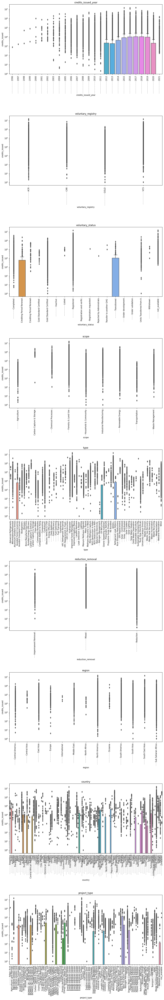

In [ ]:
cols_names = ['credits_issued_year', 'voluntary_registry','voluntary_status',
              'scope','type','reduction_removal','region',
              'country', 'project_type']
plot_boxplot_semilogy(
    df=credits_issued_df, 
    cols_to_compare = cols_names, 
    y_column='credits_issued')

# Boxplot of Credits retired in:

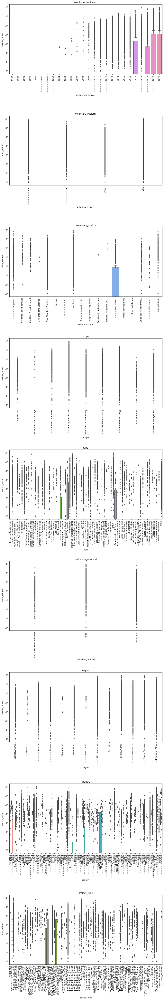

In [ ]:
cols_names = ['credits_retired_year', 'voluntary_registry','voluntary_status',
              'scope','type','reduction_removal','region',
              'country', 'project_type']
plot_boxplot_semilogy(
    df=credits_retired_df, 
    cols_to_compare = cols_names, 
    y_column='credits_retired')


#Boxplot of Credits remaining by vintage:

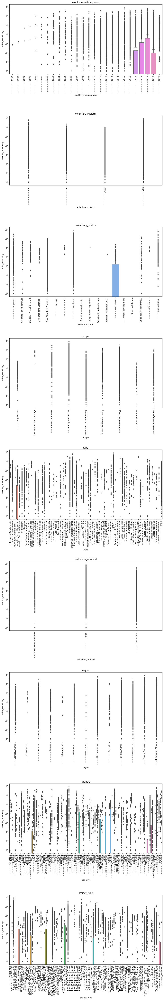

In [ ]:
cols_names = ['credits_remaining_year', 'voluntary_registry','voluntary_status',
              'scope','type','reduction_removal','region',
              'country', 'project_type']
plot_boxplot_semilogy(
    df=credits_remaining_df, 
    cols_to_compare = cols_names, 
    y_column='credits_remaining')


#Boxplot of Credits issued by issuance year (when the registry issued the credits)

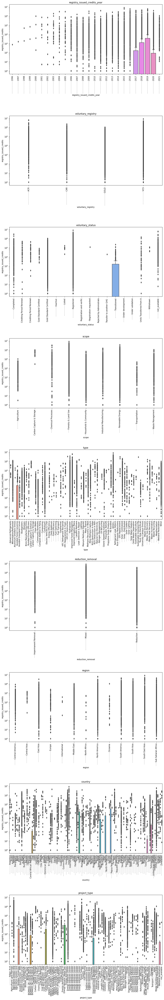

In [ ]:
cols_names = ['registry_issued_credits_year', 'voluntary_registry','voluntary_status',
              'scope','type','reduction_removal','region',
              'country', 'project_type']
plot_boxplot_semilogy(
    df=registry_issued_credits_df, 
    cols_to_compare = cols_names, 
    y_column='registry_issued_credits')


###Function to plot heatmaps

In [ ]:
def plot_heatmap(df, cols_to_compare, year_column, values_column, cols_per_row=1):  
  cols = 1
  rows = math.ceil(len(cols_to_compare)/cols)
  fig, axes = plt.subplots(rows, cols, figsize=(14*cols,12*rows))
  index=0
  #plt.subplots_adjust(left=None, bottom=None, right=None, top=None, wspace=None, hspace=0.6)
  for i in cols_to_compare:
    pivoted_df = pd.pivot_table(data=df, 
                            index=i, 
                            columns=year_column, values=values_column)
    if cols > 1 :
      ax = sns.heatmap(pivoted_df, cmap="coolwarm", ax=axes[int(index/cols),index%cols])
    else:
      ax = sns.heatmap(pivoted_df, cmap="coolwarm", ax=axes[index])
    ax.set_title(i)
    ax.set_yticklabels(get_fixed_string_list(ax.get_yticklabels(), 24))
    _= plt.setp(ax.get_xticklabels(), rotation=90)
    index = index + 1

#HeatMaps of Credits issued by vintage year (when reduction/removals occurred)

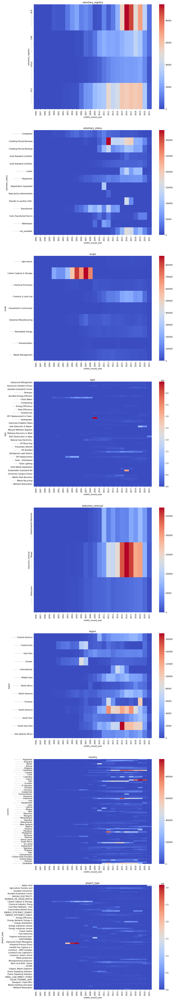

In [ ]:
cols_names = ['voluntary_registry','voluntary_status',
              'scope','type','reduction_removal','region',
              'country', 'project_type']
plot_heatmap(
    df = credits_issued_df, 
    cols_to_compare = cols_names, 
    year_column = 'credits_issued_year', 
    values_column = 'credits_issued')

#HeatMaps of Credits retired in:

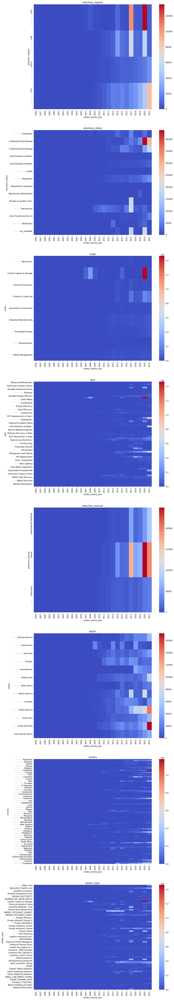

In [ ]:
cols_names = ['voluntary_registry','voluntary_status',
              'scope','type','reduction_removal','region',
              'country', 'project_type']
plot_heatmap(
    df = credits_retired_df, 
    cols_to_compare = cols_names, 
    year_column = 'credits_retired_year', 
    values_column = 'credits_retired')

#HeatMaps of Credits remaining by vintage:

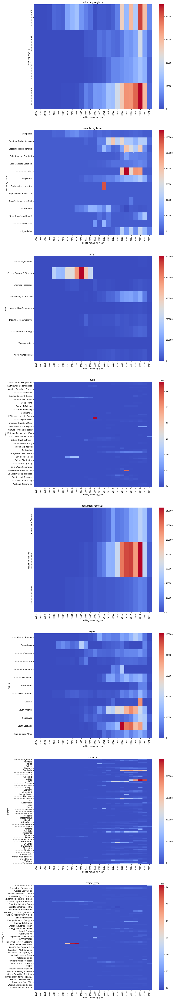

In [ ]:
cols_names = ['voluntary_registry','voluntary_status',
              'scope','type','reduction_removal','region',
              'country', 'project_type']
plot_heatmap(
    df = credits_remaining_df, 
    cols_to_compare = cols_names, 
    year_column = 'credits_remaining_year', 
    values_column = 'credits_remaining')

#HeatMaps of Credits issued by issuance year (when the registry issued the credits)

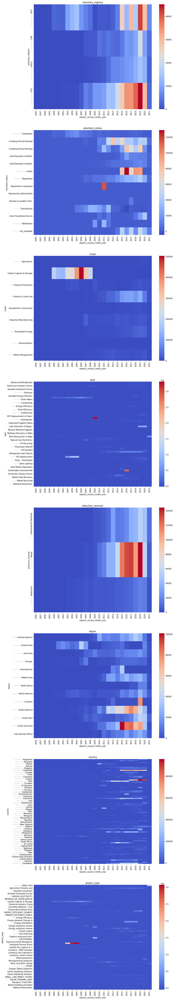

In [ ]:
cols_names = ['voluntary_registry','voluntary_status',
              'scope','type','reduction_removal','region',
              'country', 'project_type']
plot_heatmap(
    df = registry_issued_credits_df, 
    cols_to_compare = cols_names, 
    year_column = 'registry_issued_credits_year', 
    values_column = 'registry_issued_credits')

In [ ]:
registry_issued_credits_df.head(1)

,project_id,voluntary_registry,arb_project,voluntary_status,scope,type,reduction_removal,methodology_protocol,region,country,state,first_year_of_project,project_type,registry_issued_credits_year,registry_issued_credits
1,ACR102,ACR,No,Completed,Chemical Processes,SF6 Replacement,Reduction,not_available,North America,United States,OREGON,2003.0,Industrial Gas Substitution,1996,0


In [ ]:
credits_remaining_df.head(1)

,project_id,voluntary_registry,arb_project,voluntary_status,scope,type,reduction_removal,methodology_protocol,region,country,state,first_year_of_project,project_type,credits_remaining_year,credits_remaining
1,ACR102,ACR,No,Completed,Chemical Processes,SF6 Replacement,Reduction,not_available,North America,United States,OREGON,2003.0,Industrial Gas Substitution,1996,0


#Join our 4 datasets

In [ ]:
merged_df_1 = registry_issued_credits_df[[
      'project_id',
      'registry_issued_credits_year',
      'registry_issued_credits']
    ].merge(
      credits_remaining_df,
      how='outer',
      left_on=['project_id','registry_issued_credits_year'],
      right_on=['project_id',"credits_remaining_year"]
    ).drop(
        columns=['registry_issued_credits_year']
    ).rename(
        columns={"credits_remaining_year":"year"})
    
merged_df_2 = credits_retired_df[[
      'project_id',
      'credits_retired_year',
      'credits_retired']
    ].merge(
      merged_df_1,
      how='outer',
      left_on=['project_id','credits_retired_year'],
      right_on=['project_id',"year"]
    ).drop(
        columns=['credits_retired_year']
    )

full_merged_df = credits_issued_df[[
      'project_id',
      'credits_issued_year',
      'credits_issued']
    ].merge(
      merged_df_2,
      how='outer',
      left_on=['project_id','credits_issued_year'],
      right_on=['project_id',"year"]
    ).drop(
        columns=['credits_issued_year']
    )
full_merged_df.head(3)

,project_id,credits_issued,credits_retired,registry_issued_credits,voluntary_registry,arb_project,voluntary_status,scope,type,reduction_removal,methodology_protocol,region,country,state,first_year_of_project,project_type,year,credits_remaining
0,ACR102,0,0,0,ACR,No,Completed,Chemical Processes,SF6 Replacement,Reduction,not_available,North America,United States,OREGON,2003.0,Industrial Gas Substitution,1996,0
1,ACR103,0,0,0,ACR,No,Completed,Agriculture,Manure Methane Digester,Reduction,not_available,North America,United States,CALIFORNIA,2003.0,Livestock Waste Management,1996,0
2,ACR105,0,0,0,ACR,No,Completed,Forestry & Land Use,Afforestation/Reforestation,Impermanent Removal,not_available,South America,Brazil,Roraima,2011.0,Forest Carbon,1996,0


In [ ]:
# Test of grouping data by scope
df_scope = pd.DataFrame(full_merged_df.groupby(["year", "scope"])["credits_issued", "credits_retired"].sum())
df_scope

credits_issued  credits_retired
year scope                                                    
1996 Agriculture                            0                0
     Carbon Capture & Storage               0                0
     Chemical Processes                     0                0
     Forestry & Land Use                  764                0
     Household & Community                  0                0
...                                       ...              ...
2021 Household & Community            1297553          8584317
     Industrial Manufacturing          525038          8771621
     Renewable Energy                 4792532         59652285
     Transportation                         0            77353
     Waste Management                  474731          6713170

[234 rows x 2 columns]

[]

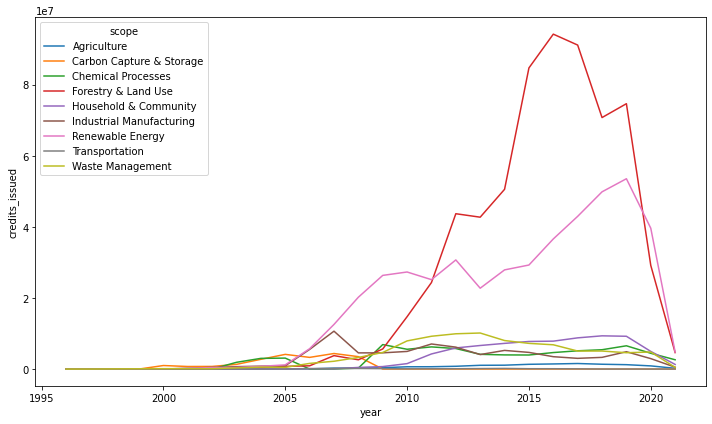

In [ ]:

plt.figure(figsize=(10,6), tight_layout=True)

g=sns.lineplot(x='year', y='credits_issued', hue='scope', data=df_scope)

plt.plot()

[]

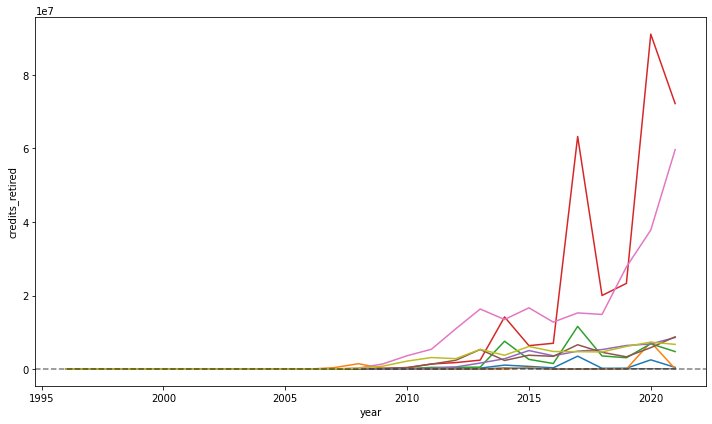

In [ ]:
plt.figure(figsize=(10,6), tight_layout=True)

g=sns.lineplot(x='year', y='credits_retired', hue='scope', data=df_scope)
g.legend_.remove()
g.axhline(100, color='black', alpha=0.5, linestyle='--')

plt.plot()

In [ ]:
# pd.crosstab(df_scope["year"], df_scope["scope"])
# issued vs retired
df_issret = full_merged_df.groupby(["year"])["credits_issued", "credits_retired", "credits_remaining"].sum().reset_index()

df_issret

,year,credits_issued,credits_retired,credits_remaining
0,1996,764,0,764
1,1997,1605,0,1605
2,1998,50724,0,50394
3,1999,77883,0,71336
4,2000,1122245,0,1074038
5,2001,1374183,0,1082942
6,2002,1778930,0,1106086
7,2003,5195060,0,3920139
8,2004,8254755,407,5151513
9,2005,10622282,369,5824968


In [ ]:
df_issret2 = pd.melt(df_issret, id_vars="year", var_name="type", value_name="total_credits")
df_issret2

,year,type,total_credits
0,1996,credits_issued,764
1,1997,credits_issued,1605
2,1998,credits_issued,50724
3,1999,credits_issued,77883
4,2000,credits_issued,1122245
...,...,...,...
73,2017,credits_remaining,76719435
74,2018,credits_remaining,82749932
75,2019,credits_remaining,110460254
76,2020,credits_remaining,73336574


[]

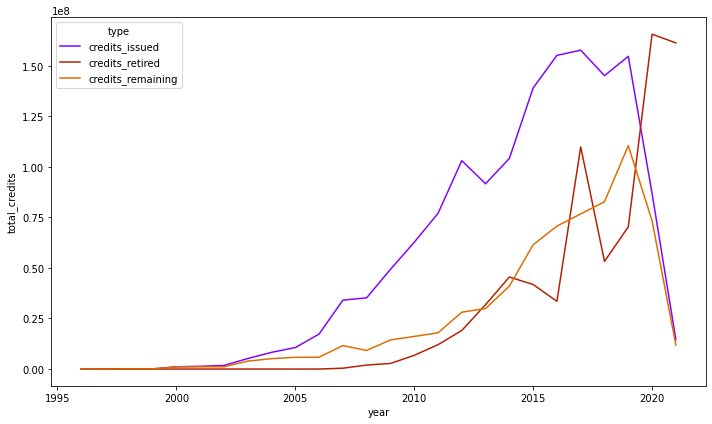

In [ ]:
plt.figure(figsize=(10,6), tight_layout=True)

g=sns.lineplot(x='year', y='total_credits', hue='type', data=df_issret2, palette='gnuplot')

# g.legend_.remove()
# g.axhline(100, color='black', alpha=0.5, linestyle='--')

plt.plot()

#Correlations

In [ ]:
full_merged_df.corr()

,credits_issued,credits_retired,registry_issued_credits,first_year_of_project,year,credits_remaining
credits_issued,1.000000,0.198157,0.813938,-1.586887e-02,7.900930e-02,0.813938
credits_retired,0.198157,1.000000,0.169801,-2.643064e-02,1.017636e-01,0.169801
registry_issued_credits,0.813938,0.169801,1.000000,-1.168835e-03,7.257649e-02,1.000000
first_year_of_project,-0.015869,-0.026431,-0.001169,1.000000e+00,-1.731779e-12,-0.001169
year,0.079009,0.101764,0.072576,-1.731779e-12,1.000000e+00,0.072576
credits_remaining,0.813938,0.169801,1.000000,-1.168835e-03,7.257649e-02,1.000000


#Correlations - 2D scatterplots

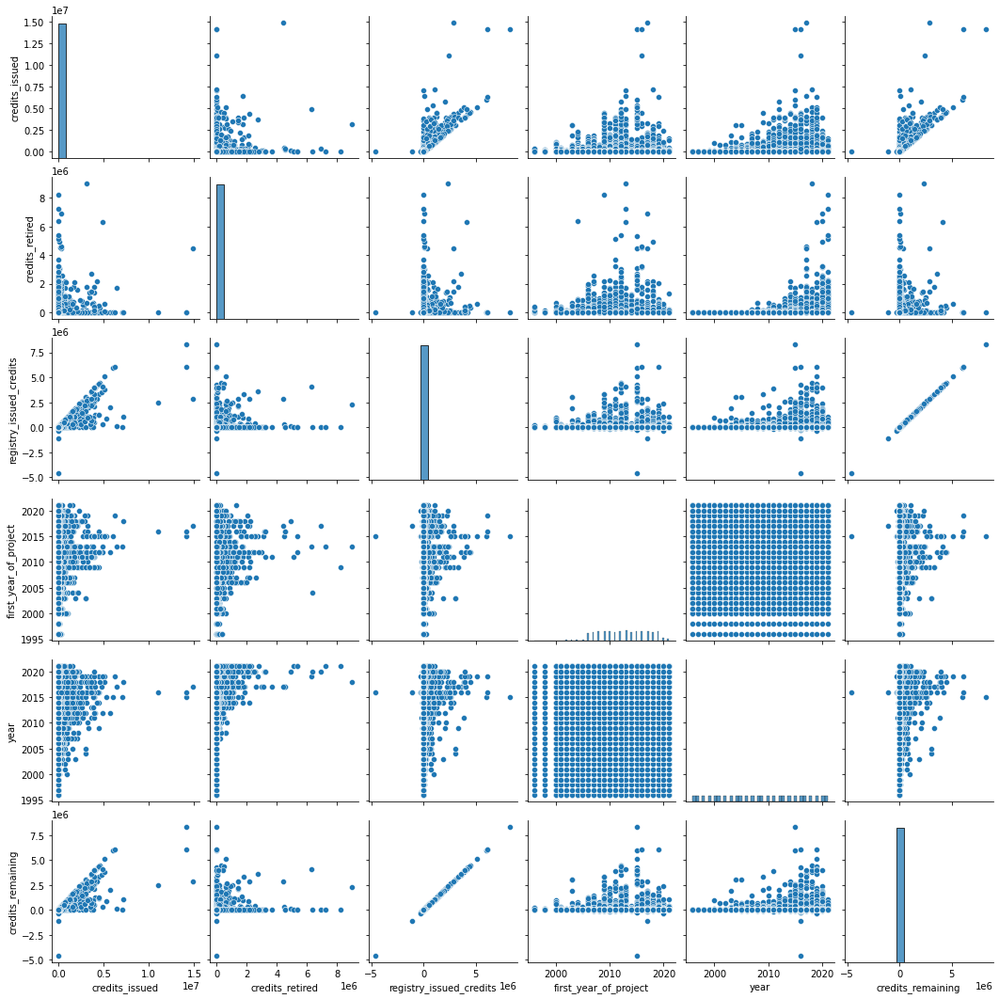

In [ ]:
sns.pairplot(full_merged_df)

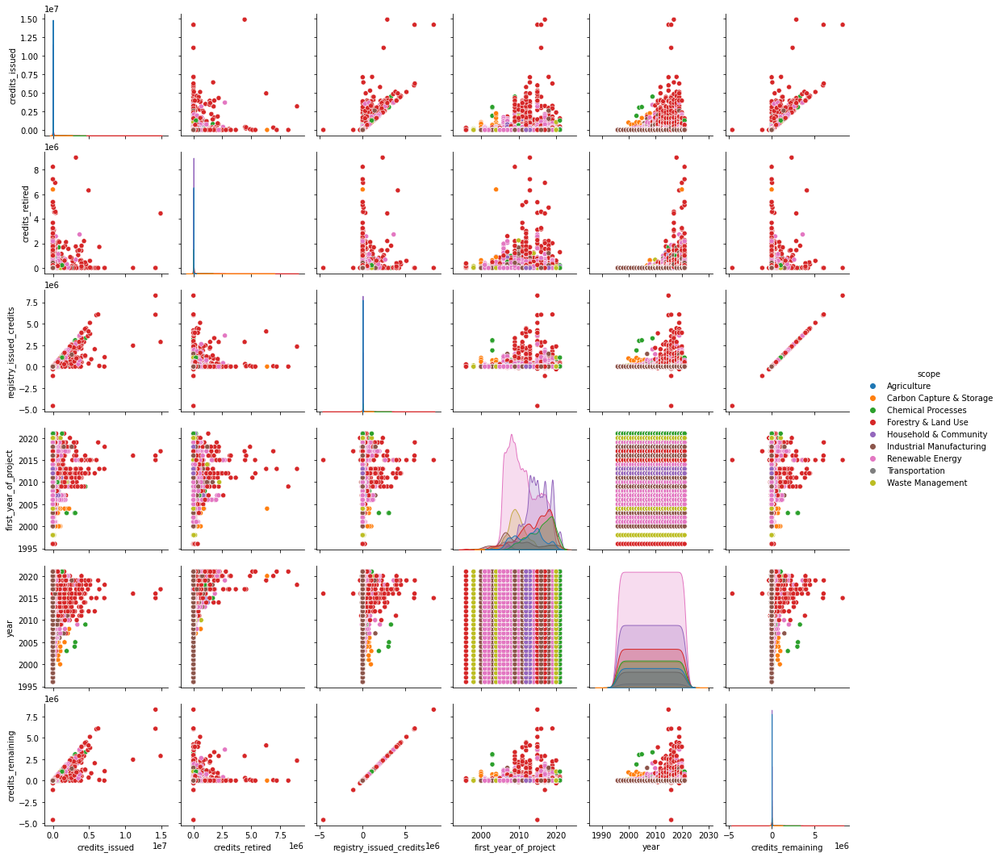

In [ ]:
sns.pairplot(full_merged_df,hue='scope')

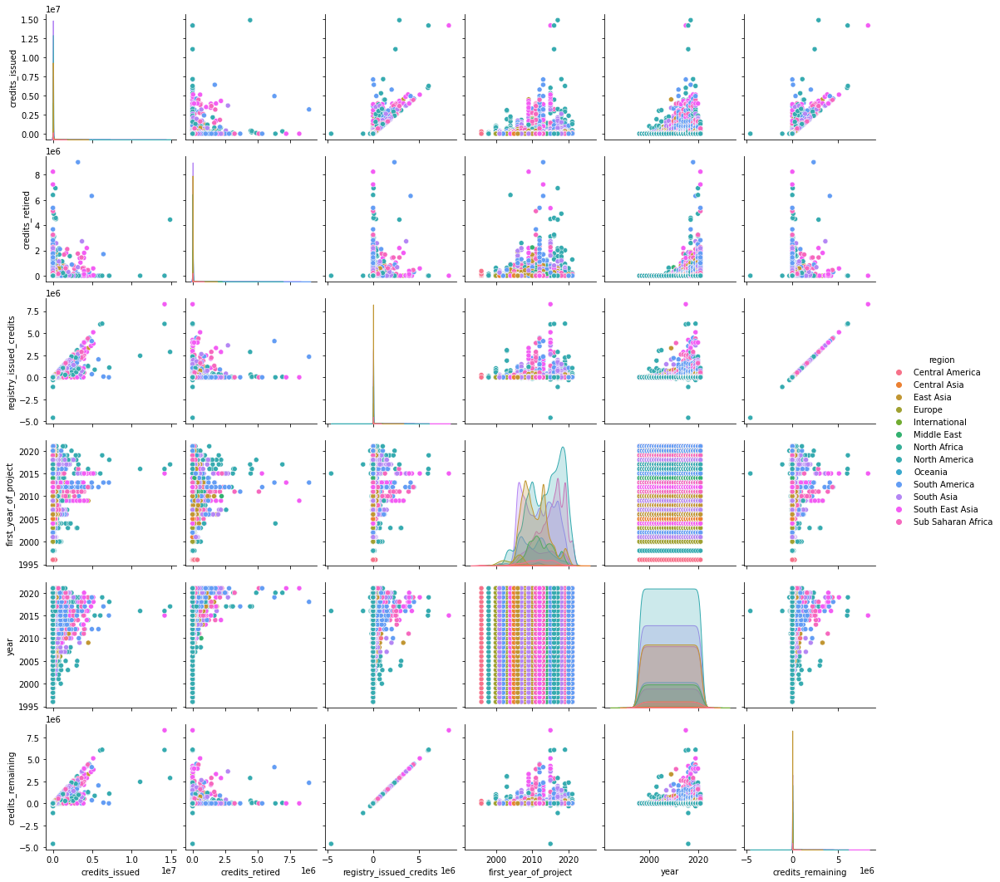

In [ ]:
sns.pairplot(full_merged_df,hue='region')

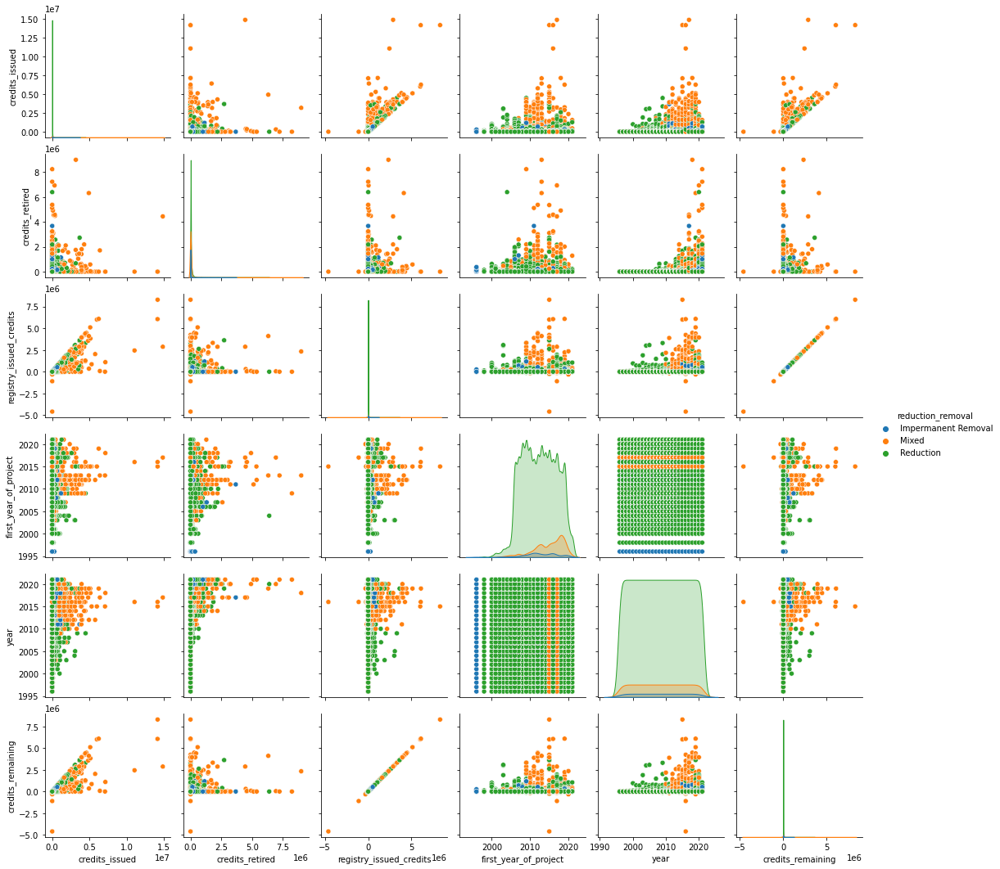

In [ ]:
sns.pairplot(full_merged_df,hue='reduction_removal')

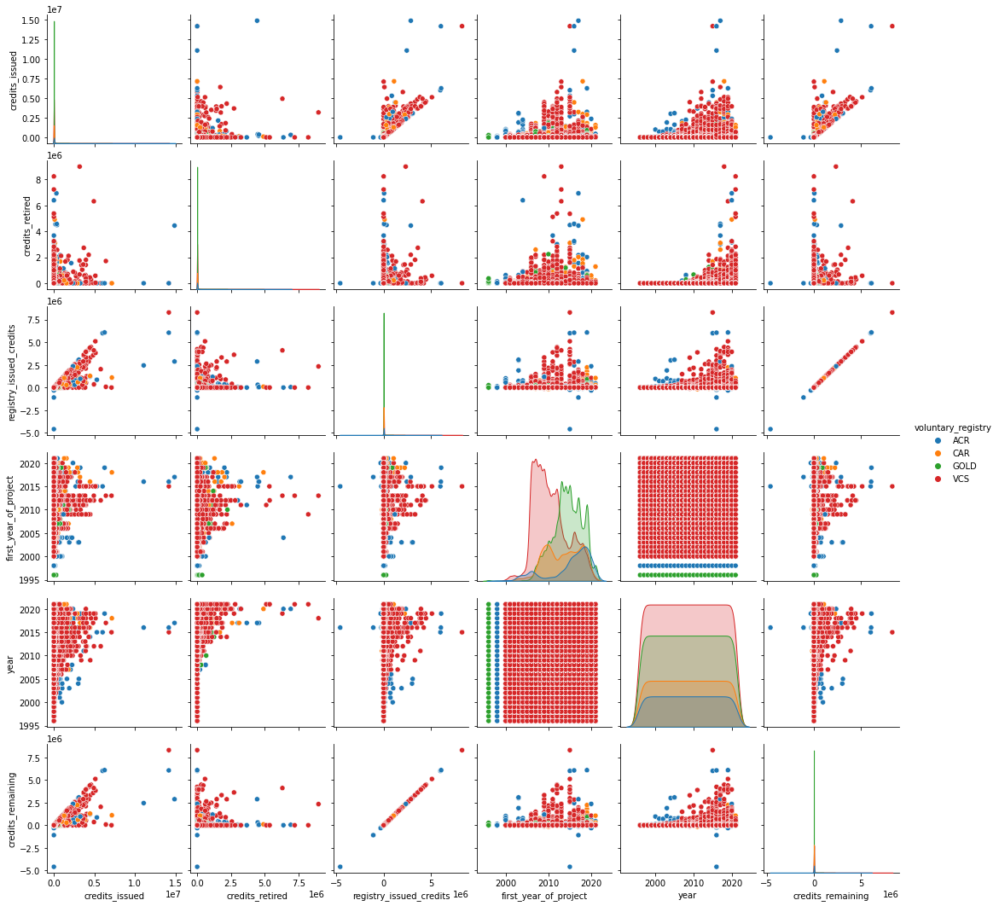

In [ ]:
sns.pairplot(full_merged_df,hue='voluntary_registry')

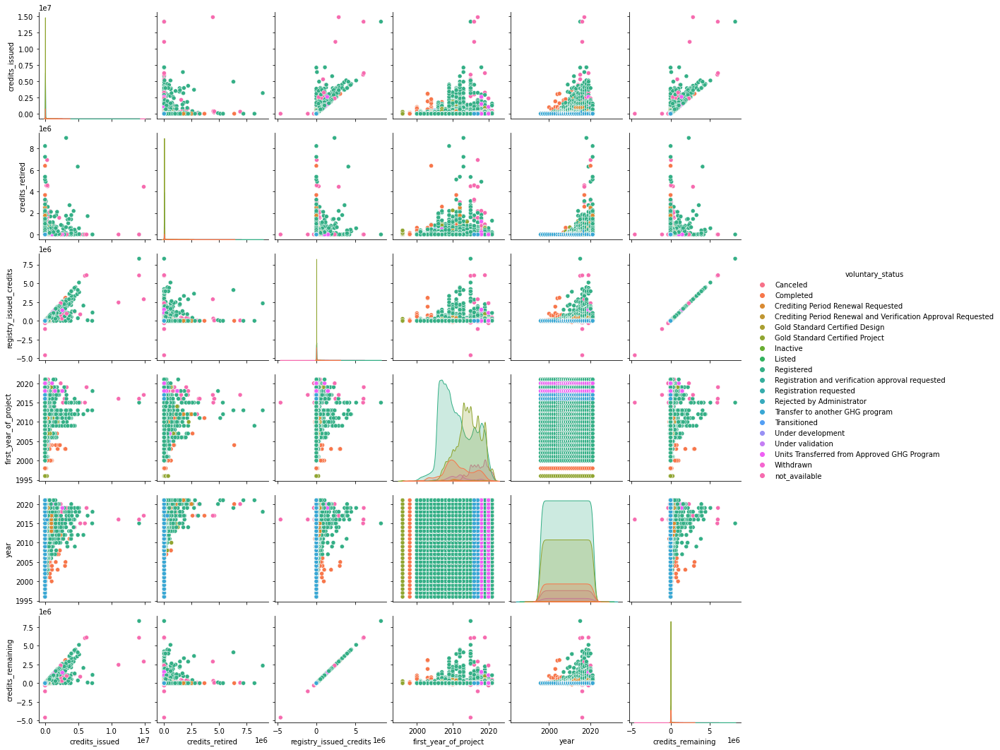

In [ ]:
sns.pairplot(full_merged_df,hue='voluntary_status')

# EDA dataset 2: CO2 emissions (kt)

Data for up to 1990 are sourced from Carbon Dioxide Information Analysis Center, Environmental Sciences Division, Oak Ridge National Laboratory, Tennessee, United States: https://data.worldbank.org/indicator/EN.ATM.CO2E.KT

To import the world bank dataset we use the following API/Package: https://pypi.org/project/wbgapi/


In [ ]:
wbco = wb.data.DataFrame(['EN.ATM.CO2E.KT'])

# Remove the preffix "YR" from the column names in World Bank datasource
wb_columns=wbco.columns
new_wb_columns = [y.replace('YR', '') for y in wb_columns]
wbco.columns = new_wb_columns


# List of country codes in World Bank Datasource
# the sub-package economy is used to obtain the information for every country (including its country name and code)
country_attributes = wb.economy.DataFrame(wbco.index.values.tolist())

# Create a country - code DataFrame
country_name = country_attributes[country_attributes['aggregate'] == False]['name']

wbco_df = wbco.join(country_name, how='right')       #Adding country names to world bank datasource
wbco_df.set_index('name', inplace=True) #Replacing old index (country codes) with new index (country names)

# Removing empty rows (countries). We could drop them because these countries did not report the information for any year.
wbco_df.dropna(how='all', inplace=True)
# Removing empty columns (years). We could drop them because the data is only available between 1990 and 2018.
wbco_df.dropna(axis=1, how='all', inplace=True)
wbco_df.shape

# Replace missing values with the previous value
wbco_df.fillna(method='bfill', axis=1, inplace=True)

# Transform data from wide format to long format
columns = wbco_df.columns
# columns
wbco_df_long = wbco_df.reset_index()
wbco_df_long = pd.melt(wbco_df_long, id_vars=['name'], value_vars=columns, var_name ='Year', value_name ='CO2_emitted')
wbco_df_long['Year'] = pd.to_datetime(wbco_df_long['Year'], format='%Y').dt.year
wbco_df_long

,name,Year,CO2_emitted
0,Afghanistan,1990,2380.000000
1,Albania,1990,5980.000000
2,Algeria,1990,62940.000000
3,Andorra,1990,410.000000
4,Angola,1990,6560.000000
...,...,...,...
5725,"Venezuela, RB",2019,112339.996338
5726,Vietnam,2019,336489.990234
5727,"Yemen, Rep.",2019,11100.000381
5728,Zambia,2019,6800.000191


## Indentify missing country names

In [ ]:
set(full_merged_df['country'].unique()) - set(wbco_df_long['name'].unique())

NameError: ignored

## Map missing names

In [ ]:
country_map = {
    "Côte d'Ivoire": "Cote d'Ivoire",  
    'Egypt': 'Egypt, Arab Rep.', 
    'Gambia':'Gambia, The',
    'Laos': 'Lao PDR',
    'Republic of Congo': 'Congo, Rep.',
    'Russia': 'Russian Federation',
    'South Korea': 'Korea, Rep.',
    'Taiwan': 'China'
}
full_merged_df['country'] = full_merged_df['country'].replace(country_map)

# Merge the carbon-market dataset with CO2 emissions dataset from world-bank

In [ ]:
all_df = full_merged_df.merge(
      wbco_df_long,
      how='left',
      left_on=['country','year'],
      right_on=['name',"Year"]
    ).drop(
        columns=['name', 'Year']
    )
all_df.head(3)

# Merge the carbon-market dataset with CO2 emissions dataset from world-bank (Option 2)

In [ ]:
full_merged_df_2 = full_merged_df.groupby(['country', 'year']).agg({'credits_issued':'sum',
                                                                  'credits_retired': 'sum', 
                                                                  'registry_issued_credits': 'sum',
                                                                  'credits_remaining': 'sum'}).reset_index()

all_df_2 = full_merged_df_2.merge(
      wbco_df_long,
      how='left',
      left_on=['country','year'],
      right_on=['name',"Year"]
    ).drop(
        columns=['name', 'Year']
    )

# One carbon credit is equal to one metric ton of carbon dioxide then we need to convert the variable CO2_emitted (Kt) to tonnes

all_df_2['CO2_emitted'] = all_df_2['CO2_emitted']*1000

# Taking the issued credits as future mitigated CO2, we could compute a percentage of the total CO2 emitted

all_df_2['percentage_mitigation'] = all_df_2['credits_issued']/all_df_2['CO2_emitted']*100

all_df_2.head(3)

In [ ]:
all_df_2[all_df_2['percentage_mitigation']>=100]

# Predictive Model using a LSTM Network (Option 1)

Try to predict the total CO2 with a LSTM Network



In [ ]:
tot_CO2 = wbco_df_long.groupby('Year')['CO2_emitted'].sum()
tot_CO2 = tot_CO2[tot_CO2.index <= 2018].reset_index()
tot_CO2.columns = ['year', 'CO2_emmited_kt']
tot_CO2.year = pd.to_datetime(tot_CO2.year, format='%Y')
tot_CO2.head()

,year,CO2_emmited_kt
0,1990-01-01,20324740.0
1,1991-01-01,20513610.0
2,1992-01-01,20457550.0
3,1993-01-01,20588180.0
4,1994-01-01,20696360.0


In [ ]:
# Create the forecaster object
sns.set(rc={'figure.figsize':(15,8)})
f = Forecaster(y=tot_CO2['CO2_emmited_kt'], current_dates=tot_CO2['year'])
f

Forecaster(
    DateStartActuals=1990-01-01T00:00:00.000000000
    DateEndActuals=2018-01-01T00:00:00.000000000
    Freq=AS-JAN
    N_actuals=29
    ForecastLength=0
    Xvars=[]
    Differenced=0
    TestLength=1
    ValidationLength=1
    ValidationMetric=rmse
    ForecastsEvaluated=[]
    CILevel=0.95
    BootstrapSamples=100
    CurrentEstimator=None
)

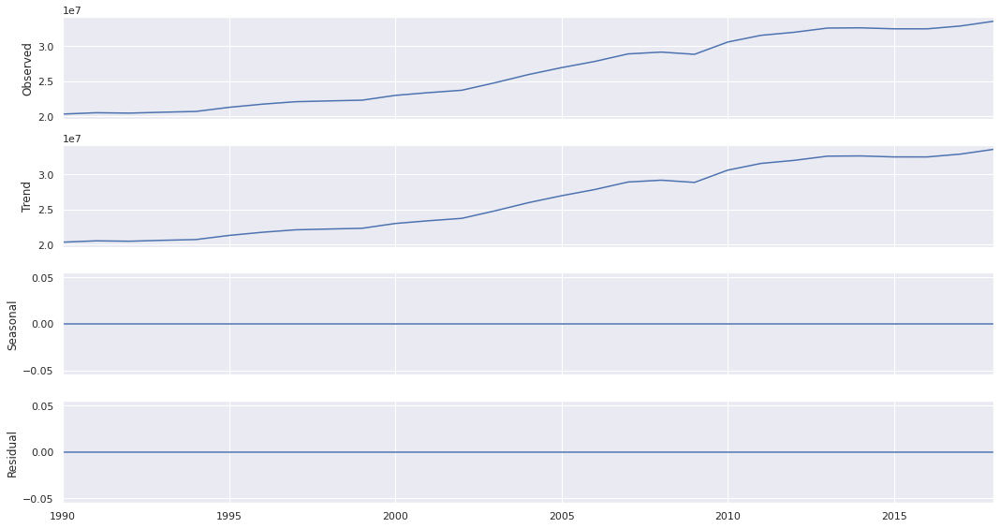

In [ ]:
f.seasonal_decompose().plot()
plt.show()

In [ ]:
f.set_test_length(4)       # 1. 4 observations to test the results
f.generate_future_dates(5) # 2. 5 future points to forecast
f.set_estimator('lstm')     # 3. LSTM neural network

1/1 [==============================] - 2s 2s/step - loss: 0.4803


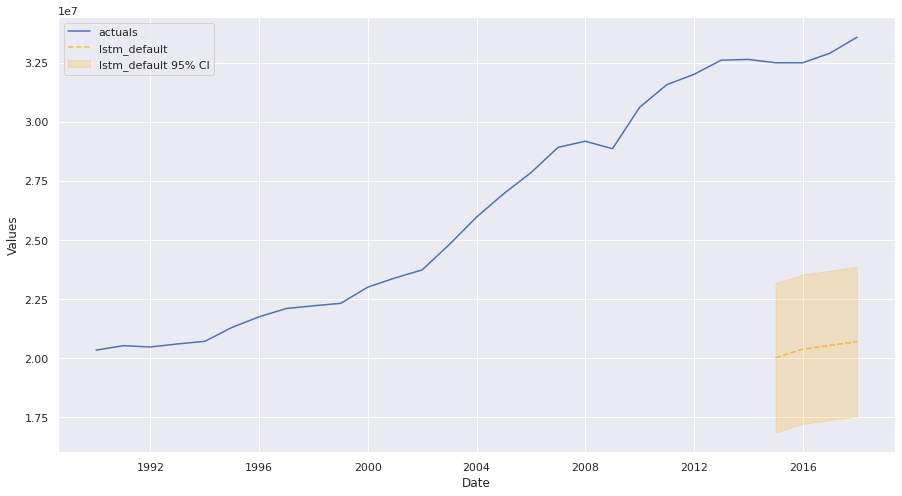

In [ ]:
f.manual_forecast(call_me='lstm_default')
f.plot_test_set(ci=True)

Epoch 1/5
1/1 [==============================] - 2s 2s/step - loss: 0.5544 - val_loss: 0.1447
Epoch 2/5
1/1 [==============================] - 0s 39ms/step - loss: 0.5506 - val_loss: 0.1422
Epoch 3/5
1/1 [==============================] - 0s 28ms/step - loss: 0.5468 - val_loss: 0.1397
Epoch 4/5
1/1 [==============================] - 0s 35ms/step - loss: 0.5430 - val_loss: 0.1373
Epoch 5/5
1/1 [==============================] - 0s 32ms/step - loss: 0.5391 - val_loss: 0.1348
Epoch 1/5
1/1 [==============================] - 2s 2s/step - loss: 0.5996 - val_loss: 0.1500
Epoch 2/5
1/1 [==============================] - 0s 33ms/step - loss: 0.5966 - val_loss: 0.1482
Epoch 3/5
1/1 [==============================] - 0s 29ms/step - loss: 0.5937 - val_loss: 0.1465
Epoch 4/5
1/1 [==============================] - 0s 30ms/step - loss: 0.5907 - val_loss: 0.1447
Epoch 5/5
1/1 [==============================] - 0s 34ms/step - loss: 0.5877 - val_loss: 0.1429


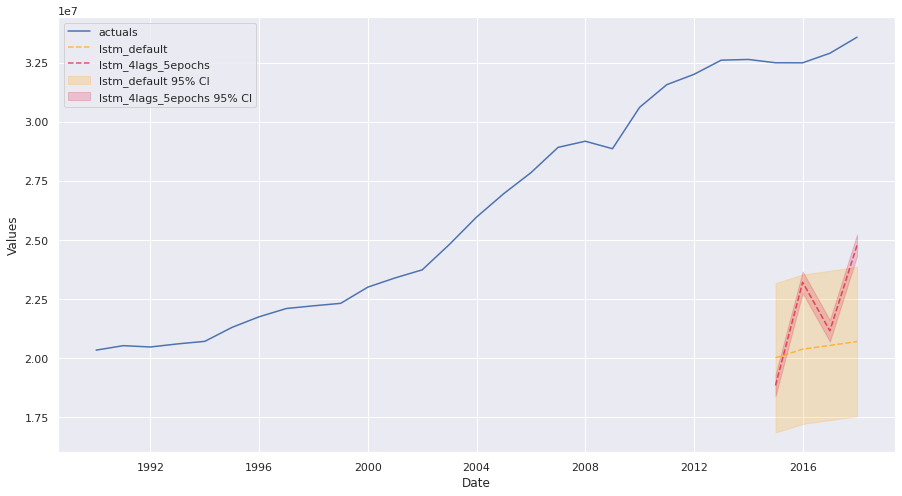

In [ ]:
f.manual_forecast(call_me='lstm_4lags_5epochs',
                  lags=4,
                  epochs=5,
                  validation_split=.2,
                  shuffle=True)
f.plot_test_set(ci=True)

Epoch 1/25
1/1 [==============================] - 7s 7s/step - loss: 0.7003 - val_loss: 0.2743
Epoch 2/25
1/1 [==============================] - 0s 42ms/step - loss: 0.6954 - val_loss: 0.2705
Epoch 3/25
1/1 [==============================] - 0s 44ms/step - loss: 0.6905 - val_loss: 0.2665
Epoch 4/25
1/1 [==============================] - 0s 46ms/step - loss: 0.6855 - val_loss: 0.2624
Epoch 5/25
1/1 [==============================] - 0s 53ms/step - loss: 0.6802 - val_loss: 0.2582
Epoch 6/25
1/1 [==============================] - 0s 49ms/step - loss: 0.6748 - val_loss: 0.2538
Epoch 7/25
1/1 [==============================] - 0s 48ms/step - loss: 0.6692 - val_loss: 0.2491
Epoch 8/25
1/1 [==============================] - 0s 45ms/step - loss: 0.6632 - val_loss: 0.2443
Epoch 9/25
1/1 [==============================] - 0s 45ms/step - loss: 0.6569 - val_loss: 0.2391
Epoch 10/25
1/1 [==============================] - 0s 49ms/step - loss: 0.6503 - val_loss: 0.2337
Epoch 11/25
1/1 [==============

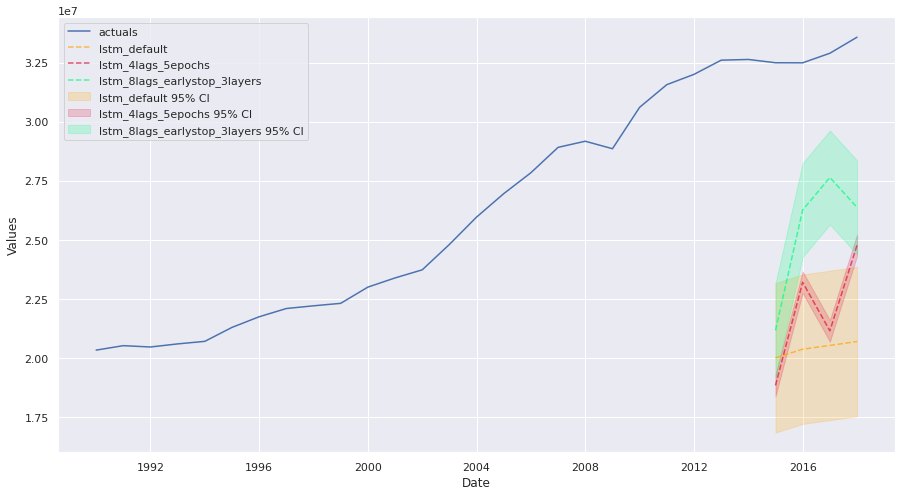

In [ ]:
from tensorflow.keras.callbacks import EarlyStopping
f.manual_forecast(call_me='lstm_8lags_earlystop_3layers',
                  lags=8,
                  epochs=25,
                  validation_split=.2,
                  shuffle=True,
                  callbacks=EarlyStopping(monitor='val_loss',
                                          patience=5),
                  lstm_layer_sizes=(16,16,16),
                  dropout=(0,0,0))
f.plot_test_set(ci=True)

Epoch 1/15
1/1 [==============================] - 9s 9s/step - loss: 0.8783 - val_loss: 0.7175
Epoch 2/15
1/1 [==============================] - 0s 58ms/step - loss: 0.8586 - val_loss: 0.6982
Epoch 3/15
1/1 [==============================] - 0s 61ms/step - loss: 0.8359 - val_loss: 0.6731
Epoch 4/15
1/1 [==============================] - 0s 71ms/step - loss: 0.8063 - val_loss: 0.6391
Epoch 5/15
1/1 [==============================] - 0s 60ms/step - loss: 0.7662 - val_loss: 0.5919
Epoch 6/15
1/1 [==============================] - 0s 58ms/step - loss: 0.7106 - val_loss: 0.5254
Epoch 7/15
1/1 [==============================] - 0s 64ms/step - loss: 0.6322 - val_loss: 0.4305
Epoch 8/15
1/1 [==============================] - 0s 69ms/step - loss: 0.5206 - val_loss: 0.2939
Epoch 9/15
1/1 [==============================] - 0s 68ms/step - loss: 0.3602 - val_loss: 0.1087
Epoch 10/15
1/1 [==============================] - 0s 60ms/step - loss: 0.1613 - val_loss: 0.2489
Epoch 11/15
1/1 [==============

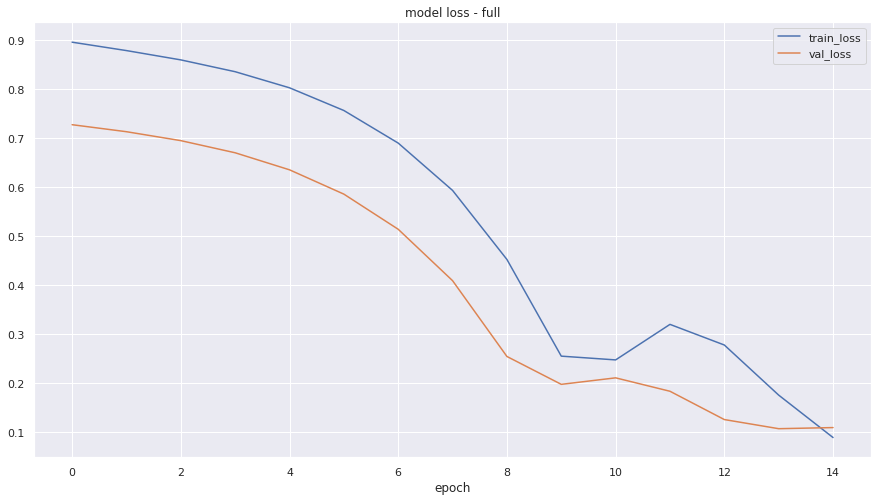

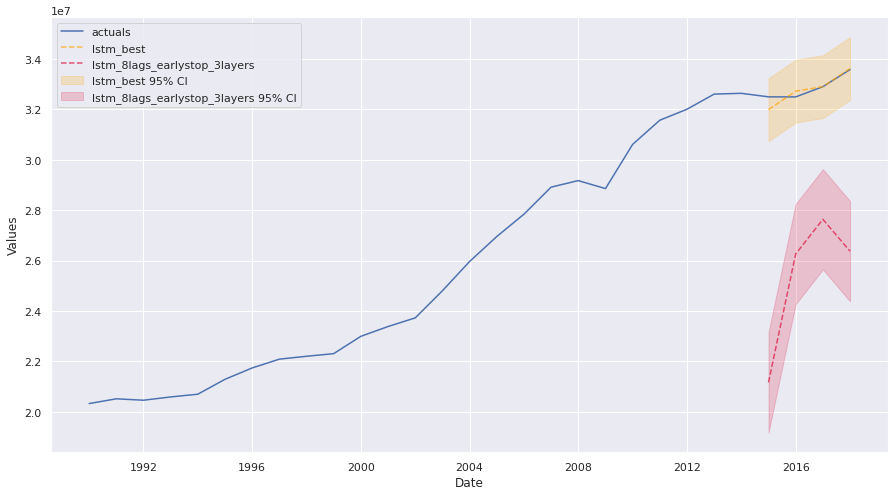

In [ ]:
f.manual_forecast(call_me='lstm_best',
                  lags=16,
                  batch_size=32,
                  epochs=15,
                  validation_split=.2,
                  shuffle=True,
                  activation='tanh',
                  optimizer='Adam',
                  learning_rate=0.001,
                  lstm_layer_sizes=(72,)*4,
                  dropout=(0,)*4,
                  plot_loss=True)
f.plot_test_set(order_by='LevelTestSetMAPE',models='top_2',ci=True)

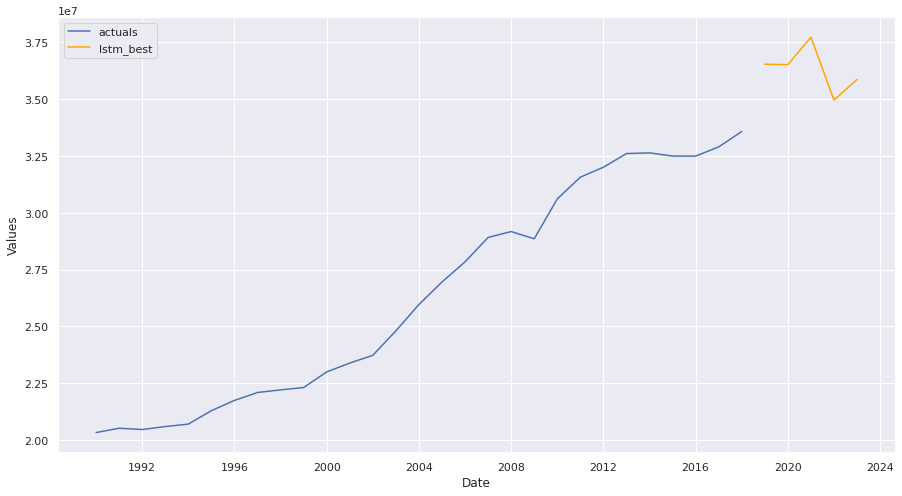

In [ ]:
f.plot(models=['lstm_best'],
       order_by='LevelTestSetMAPE',
       level=True)

In [ ]:
f.export('model_summaries',determine_best_by='LevelTestSetMAPE')[
    ['ModelNickname',
     'LevelTestSetMAPE',
     'LevelTestSetRMSE',
     'LevelTestSetR2',
     'best_model']
]

,ModelNickname,LevelTestSetMAPE,LevelTestSetRMSE,LevelTestSetR2,best_model
0,lstm_best,0.005992,2.805865e+05,0.598767,True
1,lstm_8lags_earlystop_3layers,0.228814,7.857366e+06,-313.642279,False
2,lstm_4lags_5epochs,0.331579,1.105656e+07,-622.021843,False
3,lstm_default,0.379478,1.247616e+07,-792.277210,False


# CNN LSTM (Option 2)

In [ ]:
tot_CO2 = wbco_df_long.groupby('Year')['CO2_emitted'].sum()
tot_CO2 = tot_CO2[tot_CO2.index <= 2018].reset_index()
tot_CO2.columns = ['year', 'CO2_emmited_kt']
tot_CO2.year = pd.to_datetime(tot_CO2.year, format='%Y').dt.year
tot_CO2.head()

,year,CO2_emmited_kt
0,1990,20324740.0
1,1991,20513610.0
2,1992,20457550.0
3,1993,20588180.0
4,1994,20696360.0


In [ ]:
tot_CO2['CO2_emmited_kt'].values

array([20324740., 20513610., 20457550., 20588180., 20696360., 21287210.,
       21737560., 22087310., 22201450., 22306080., 22992490., 23382530.,
       23725130., 24799710., 25959200., 26953170., 27839220., 28913070.,
       29172200., 28855410., 30609240., 31568230., 32003820., 32605200.,
       32636120., 32496280., 32493540., 32898920., 33579000.])

In [ ]:
from keras.models import Sequential
from keras.layers import LSTM
from keras.layers import Dense
from keras.layers import Flatten
from keras.layers import TimeDistributed
from keras.layers.convolutional import Conv1D
from keras.layers.convolutional import MaxPooling1D
from numpy import array
import tensorflow as tf

# split a univariate sequence into samples
def split_sequence(sequence, n_steps):
	X, y = list(), list()
	for i in range(len(sequence)):
		# find the end of this pattern
		end_ix = i + n_steps
		# check if we are beyond the sequence
		if end_ix > len(sequence)-1:
			break
		# gather input and output parts of the pattern
		seq_x, seq_y = sequence[i:end_ix], sequence[end_ix]
		X.append(seq_x)
		y.append(seq_y)
	return array(X), array(y)
 
raw_seq = tot_CO2['CO2_emmited_kt'].values
# choose a number of time steps
n_steps = 4
# split into samples
X, y = split_sequence(raw_seq, n_steps)
# reshape from [samples, timesteps] into [samples, subsequences, timesteps, features]
n_features = 1
n_seq = 2
n_steps = 2
X = X.reshape((X.shape[0], n_seq, n_steps, n_features))
# define model
model = Sequential()
model.add(TimeDistributed(Conv1D(filters=64, kernel_size=1, activation='relu'), input_shape=(None, n_steps, n_features)))
model.add(TimeDistributed(MaxPooling1D(pool_size=2)))
model.add(TimeDistributed(Flatten()))
model.add(LSTM(50, activation='relu'))
model.add(Dense(1))
model.compile(optimizer='adam', loss='mse', metrics=[tf.keras.metrics.RootMeanSquaredError()])
# fit model
callback = tf.keras.callbacks.EarlyStopping(monitor='val_root_mean_squared_error', patience=50)
history = model.fit(X, y, validation_split=0.1, epochs=500, verbose=0, callbacks=[callback])
# demonstrate prediction
x_input = array(tot_CO2['CO2_emmited_kt'].values[-4:])
x_input = x_input.reshape((1, n_seq, n_steps, n_features))
yhat = model.predict(x_input, verbose=0)
print(yhat)

[[34419416.]]


In [ ]:
for i in range(2019, 2050):
  x_input = array(tot_CO2['CO2_emmited_kt'].values[-4:])
  x_input = x_input.reshape((1, n_seq, n_steps, n_features))
  prediction = model.predict(x_input, verbose=0)
  df = {'year': i, 'CO2_emmited_kt': prediction[0][0]}
  tot_CO2 = tot_CO2.append(df, ignore_index=True)

In [ ]:
tot_CO2['year'] = pd.to_datetime(tot_CO2.year, format='%Y').dt.year
tot_CO2.head()

,year,CO2_emmited_kt
0,1990,20324740.0
1,1991,20513610.0
2,1992,20457550.0
3,1993,20588180.0
4,1994,20696360.0


In [ ]:
# https://e360.yale.edu/features/what_is_the_carbon_limit_that_depends_who_you_ask

tot_CO2['prediction'] = np.nan
tot_CO2['prediction'] = tot_CO2['year'].apply(lambda x: 'Actual' if x <= 2018 else 'Prediction')
temp = tot_CO2[tot_CO2['year'] >= 2014]
temp['acumm_CO2'] = temp['CO2_emmited_kt'].cumsum()
temp.drop(['CO2_emmited_kt', 'prediction'], axis=1, inplace=True)
tot_CO2 = tot_CO2.merge(temp, how='left', on='year')
tot_CO2.head(30)

,year,CO2_emmited_kt,prediction,acumm_CO2
0,1990,20324740.0,Actual,NaN
1,1991,20513610.0,Actual,NaN
2,1992,20457550.0,Actual,NaN
3,1993,20588180.0,Actual,NaN
4,1994,20696360.0,Actual,NaN
5,1995,21287210.0,Actual,NaN
6,1996,21737560.0,Actual,NaN
7,1997,22087310.0,Actual,NaN
8,1998,22201450.0,Actual,NaN
9,1999,22306080.0,Actual,NaN


In [ ]:
tot_CO2.fillna(0, inplace=True)
# The accumulated CO2 is over 350000000 (buget)
year_no_return_Greenpeace = tot_CO2[tot_CO2['acumm_CO2'] >= 350000000][0:1]['year'].values
year_no_return_Greenpeace

array([2024])

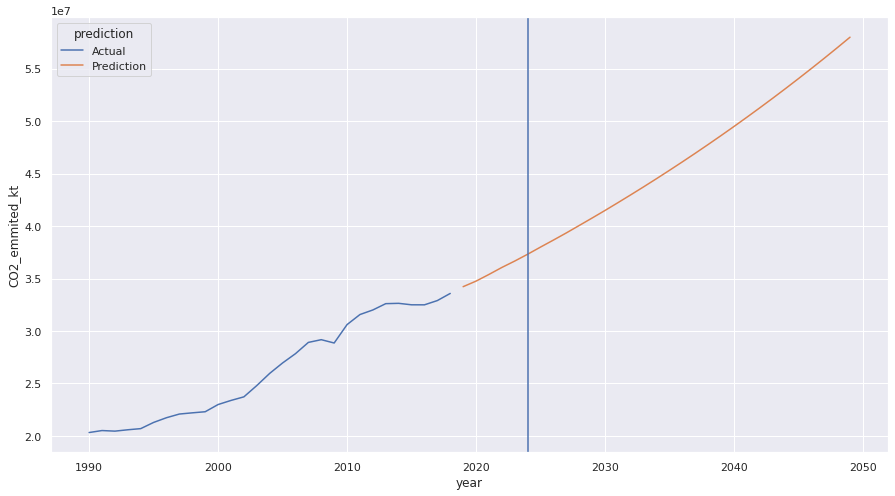

In [ ]:
sns.set(rc={'figure.figsize':(15,8)})
graph = sns.lineplot(x='year', y='CO2_emmited_kt', data=tot_CO2, hue='prediction')
graph.axvline(year_no_return_Greenpeace)

In [ ]:
model.summary()

Model: "sequential_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 time_distributed_9 (TimeDis  (None, None, 2, 64)      128       
 tributed)                                                       
                                                                 
 time_distributed_10 (TimeDi  (None, None, 1, 64)      0         
 stributed)                                                      
                                                                 
 time_distributed_11 (TimeDi  (None, None, 64)         0         
 stributed)                                                      
                                                                 
 lstm_3 (LSTM)               (None, 50)                23000     
                                                                 
 dense_3 (Dense)             (None, 1)                 51        
                                                      

In [ ]:
history.history['root_mean_squared_error'][-1]

649145.1875

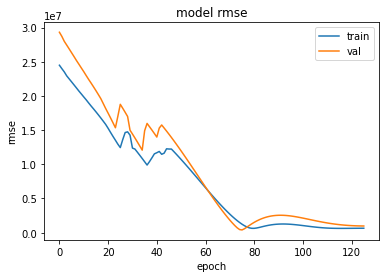

In [ ]:
plt.plot(history.history['root_mean_squared_error'])
plt.plot(history.history['val_root_mean_squared_error'])
plt.title('model rmse')
plt.ylabel('rmse')
plt.xlabel('epoch')
plt.legend(['train', 'val'], loc='upper rihgt')
plt.show()

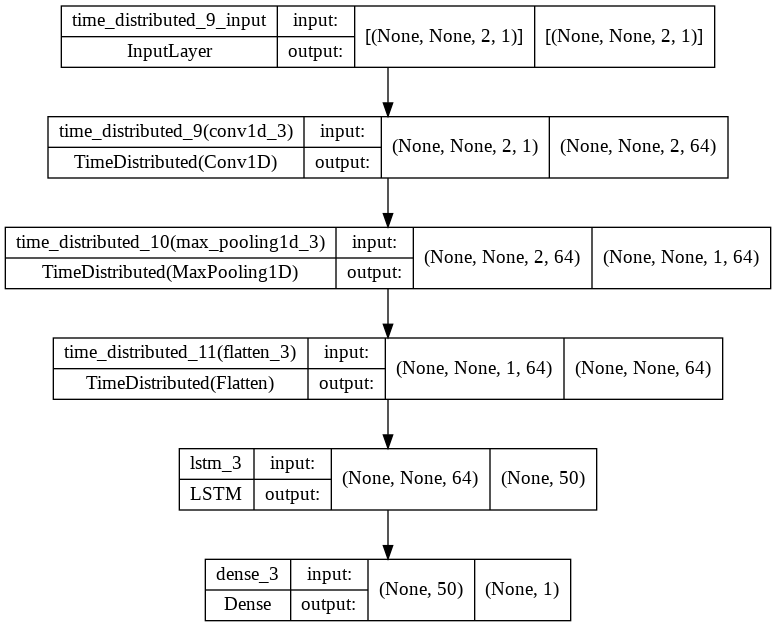

In [ ]:
from keras.utils.vis_utils import plot_model
plot_model(model, to_file='model_plot.png', show_shapes=True, show_layer_names=True)

In [ ]:
# Save model for to replicate the predictions

model.save('cnn-lstm-co2.h5')

# CNN LSTM - World data (Load model and plot)

In [ ]:
from tensorflow import keras
from numpy import array

model = keras.models.load_model('cnn-lstm-co2.h5')

In [ ]:
tot_CO2 = wbco_df_long.groupby('Year')['CO2_emitted'].sum()
tot_CO2 = tot_CO2.reset_index()
tot_CO2.columns = ['year', 'CO2_emmited_kt']
tot_CO2.year = pd.to_datetime(tot_CO2.year, format='%Y').dt.year
tot_CO2.tail()

,year,CO2_emmited_kt
25,2015,3.255168e+07
26,2016,3.257439e+07
27,2017,3.306370e+07
28,2018,3.382809e+07
29,2019,3.388201e+07


In [ ]:
def predict_co2(data, model, years_predict=25, n_seq=2, n_steps=2, n_features=1, time_step=4):
  
  data_pred = data.copy()

  last_year = data['year'].iloc[-1]

  for i in range(last_year + 1, last_year + years_predict):
    x_input = array(data_pred['CO2_emmited_kt'].values[-time_step:])
    x_input = x_input.reshape((1, n_seq, n_steps, n_features))
    prediction = model.predict(x_input, verbose=0)
    df = {'year': i, 'CO2_emmited_kt': prediction[0][0]}
    data_pred = data_pred.append(df, ignore_index=True)

  data_pred['prediction'] = np.nan
  data_pred['prediction'] = data_pred['year'].apply(lambda x: 'Actual' if x <= last_year else 'Prediction')
  temp = data_pred[data_pred['year'] >= 2014]
  temp['acumm_CO2'] = temp['CO2_emmited_kt'].cumsum()
  temp.drop(['CO2_emmited_kt', 'prediction'], axis=1, inplace=True)
  data_pred = data_pred.merge(temp, how='left', on='year')
  data_pred.fillna(0, inplace=True)
  data_pred['year'] = pd.to_datetime(data_pred['year'], format='%Y').dt.year

  return data_pred

In [ ]:
data_pred = predict_co2(data=tot_CO2, model=model)

In [ ]:
data_pred.to_csv('prediction_df_global.csv')

In [ ]:
year_no_return_Greenpeace = data_pred[data_pred['acumm_CO2'] >= 350000000][0:1]['year'].values
year_no_return_IPCC = data_pred[data_pred['acumm_CO2'] >= 485000000][0:1]['year'].values
print(year_no_return_Greenpeace, year_no_return_IPCC)

[2024] [2027]


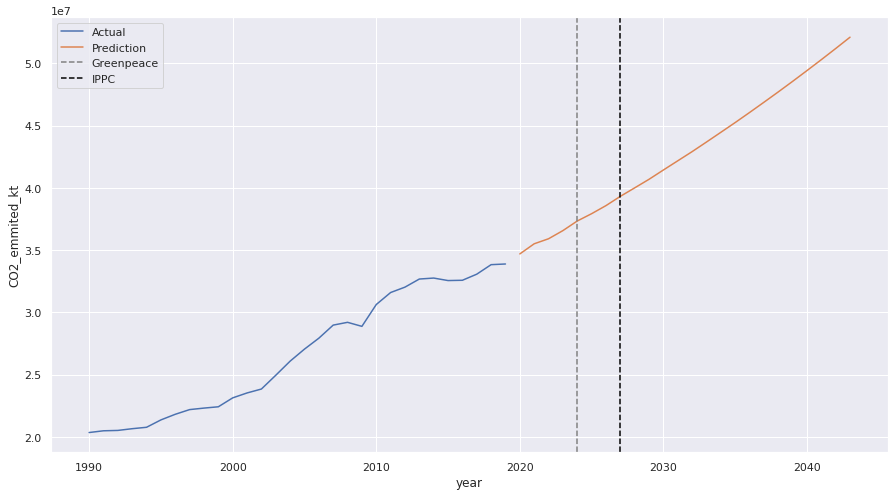

In [ ]:
sns.set(rc={'figure.figsize':(15,8)})
graph = sns.lineplot(x='year', y='CO2_emmited_kt', data=data_pred, hue='prediction')
graph.axvline(year_no_return_Greenpeace, linestyle='--', color='Grey', label='Greenpeace')
graph.axvline(year_no_return_IPCC, linestyle='--', color='Black', label='IPPC')
plt.legend()

# CNN LSTM - Colombia (Train model)

In [ ]:
tot_CO2 = wbco_df_long.groupby(['Year', 'name'])['CO2_emitted'].sum()
tot_CO2 = tot_CO2.reset_index()
tot_CO2.columns = ['year', 'country', 'CO2_emmited_kt']
tot_CO2.year = pd.to_datetime(tot_CO2.year, format='%Y').dt.year
tot_CO2 = tot_CO2[tot_CO2.country == 'Colombia'].drop('country', axis=1)
tot_CO2.head()

,year,CO2_emmited_kt
36,1990,48730.0
227,1991,50440.0
418,1992,52510.0
609,1993,55880.0
800,1994,56780.0


In [ ]:
from keras.models import Sequential
from keras.layers import LSTM
from keras.layers import Dense
from keras.layers import Flatten
from keras.layers import TimeDistributed
from keras.layers.convolutional import Conv1D
from keras.layers.convolutional import MaxPooling1D
from numpy import array
import tensorflow as tf

# split a univariate sequence into samples
def split_sequence(sequence, n_steps):
	X, y = list(), list()
	for i in range(len(sequence)):
		# find the end of this pattern
		end_ix = i + n_steps
		# check if we are beyond the sequence
		if end_ix > len(sequence)-1:
			break
		# gather input and output parts of the pattern
		seq_x, seq_y = sequence[i:end_ix], sequence[end_ix]
		X.append(seq_x)
		y.append(seq_y)
	return array(X), array(y)
 
raw_seq = tot_CO2['CO2_emmited_kt'].values
# choose a number of time steps
n_steps = 16
# split into samples
X, y = split_sequence(raw_seq, n_steps)
# reshape from [samples, timesteps] into [samples, subsequences, timesteps, features]
n_features = 1
n_seq = 4
n_steps = 4
X = X.reshape((X.shape[0], n_seq, n_steps, n_features))
# define model
model = Sequential()
model.add(TimeDistributed(Conv1D(filters=64, kernel_size=1, activation='relu'), input_shape=(None, n_steps, n_features)))
model.add(TimeDistributed(MaxPooling1D(pool_size=2)))
model.add(TimeDistributed(Flatten()))
model.add(LSTM(50, activation='relu'))
model.add(Dense(1))
model.compile(optimizer='adam', loss='mse', metrics=[tf.keras.metrics.RootMeanSquaredError()])
# fit model
callback = tf.keras.callbacks.EarlyStopping(monitor='val_root_mean_squared_error', patience=50)
history = model.fit(X, y, validation_split=0.3, epochs=500, verbose=0, callbacks=[callback])
# demonstrate prediction
x_input = array(tot_CO2['CO2_emmited_kt'].values[-16:])
x_input = x_input.reshape((1, n_seq, n_steps, n_features))
yhat = model.predict(x_input, verbose=0)
print(yhat)

[[78524.98]]


In [ ]:
history.history['root_mean_squared_error'][-1]

4112.68798828125

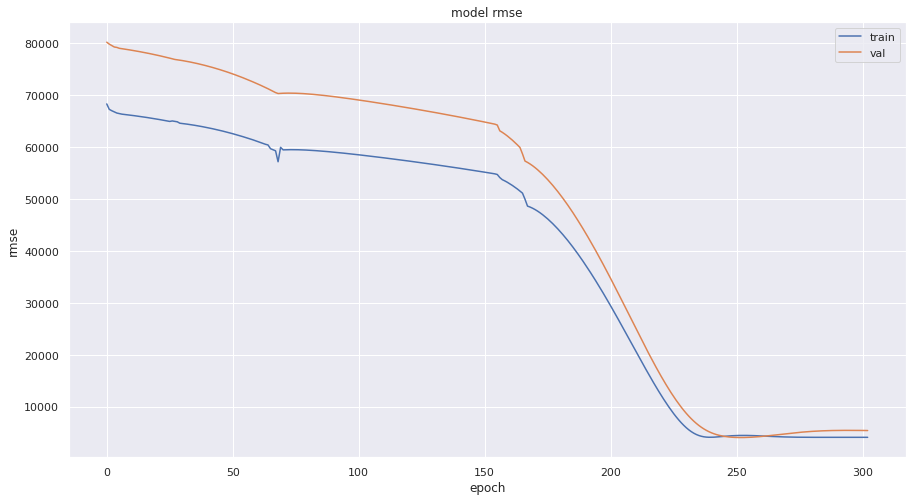

In [ ]:
plt.plot(history.history['root_mean_squared_error'])
plt.plot(history.history['val_root_mean_squared_error'])
plt.title('model rmse')
plt.ylabel('rmse')
plt.xlabel('epoch')
plt.legend(['train', 'val'], loc='upper rihgt')
plt.show()

In [ ]:
# Save model for to replicate the predictions

model.save('cnn-lstm-co2_Colombia_2.h5')

# CNN LSTM - Colombia (Load and predict)

In [ ]:
tot_CO2 = wbco_df_long.groupby(['Year', 'name'])['CO2_emitted'].sum()
tot_CO2 = tot_CO2.reset_index()
tot_CO2.columns = ['year', 'country', 'CO2_emmited_kt']
tot_CO2.year = pd.to_datetime(tot_CO2.year, format='%Y').dt.year
tot_CO2 = tot_CO2[tot_CO2.country == 'Colombia'].drop('country', axis=1)
tot_CO2.head()

,year,CO2_emmited_kt
36,1990,48730.0
227,1991,50440.0
418,1992,52510.0
609,1993,55880.0
800,1994,56780.0


In [ ]:
model = keras.models.load_model('cnn-lstm-co2_Colombia_2.h5')

In [ ]:
data_pred_Col = predict_co2(data=tot_CO2, model=model, n_seq=4, n_steps=4, time_step=16)

In [ ]:
data_pred_Col.to_csv('prediction_df_colombia.csv')

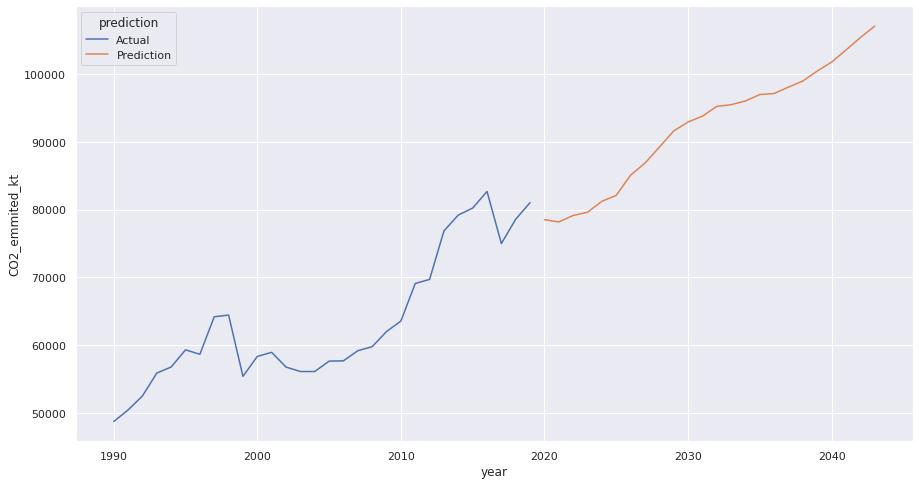

In [ ]:
sns.set(rc={'figure.figsize':(15,8)})
graph = sns.lineplot(x='year', y='CO2_emmited_kt', data=data_pred_Col, hue='prediction')

# Compare world vs Col

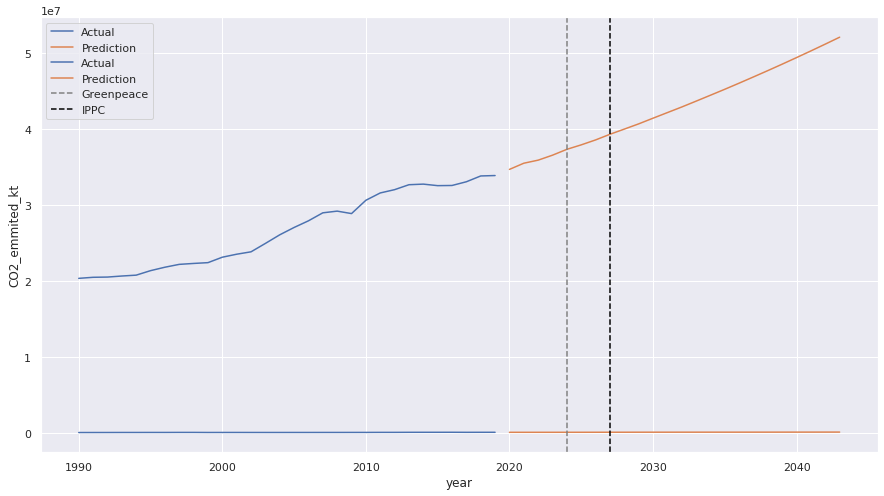

In [ ]:
sns.set(rc={'figure.figsize':(15,8)})
graph = sns.lineplot(x='year', y='CO2_emmited_kt', data=data_pred, hue='prediction')
sns.lineplot(x='year', y='CO2_emmited_kt', data=data_pred_Col, hue='prediction')
graph.axvline(year_no_return_Greenpeace, linestyle='--', color='Grey', label='Greenpeace')
graph.axvline(year_no_return_IPCC, linestyle='--', color='Black', label='IPPC')
plt.legend()

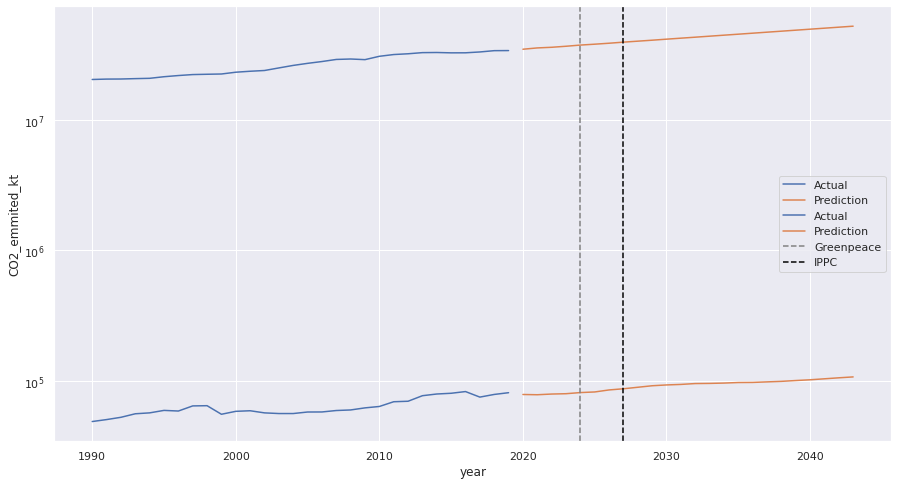

In [ ]:
sns.set(rc={'figure.figsize':(15,8)})
graph = sns.lineplot(x='year', y='CO2_emmited_kt', data=data_pred, hue='prediction')
sns.lineplot(x='year', y='CO2_emmited_kt', data=data_pred_Col, hue='prediction')
graph.set(yscale='log')
graph.axvline(year_no_return_Greenpeace, linestyle='--', color='Grey', label='Greenpeace')
graph.axvline(year_no_return_IPCC, linestyle='--', color='Black', label='IPPC')
plt.legend()

# ARIMA Model CO2_emitted 

In [ ]:
tot_CO2 = wbco_df_long.groupby('Year')['CO2_emitted'].sum()
tot_CO2 = tot_CO2[tot_CO2.index <= 2018].reset_index()
tot_CO2.columns = ['year', 'CO2_emmited_kt']
tot_CO2.year = pd.to_datetime(tot_CO2.year, format='%Y').dt.year
tot_CO2.head()
sns.set(rc={'figure.figsize':(15,8)})

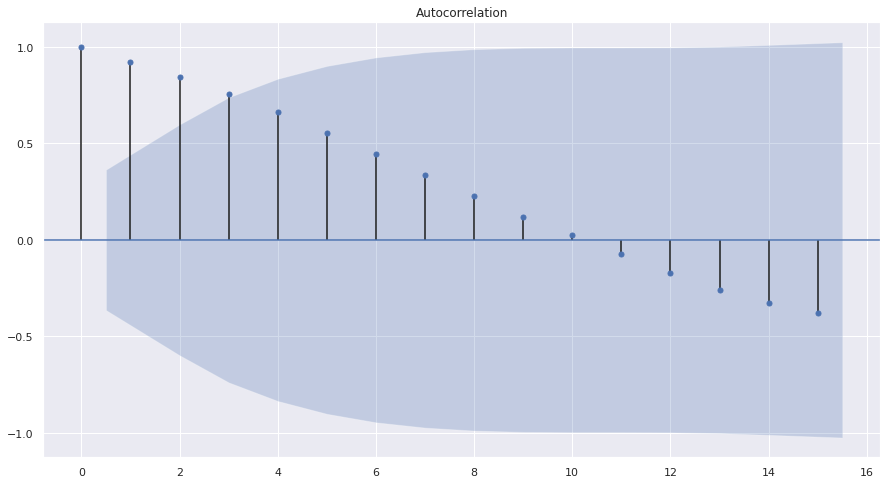

In [ ]:
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
plot_acf(tot_CO2.CO2_emmited_kt);

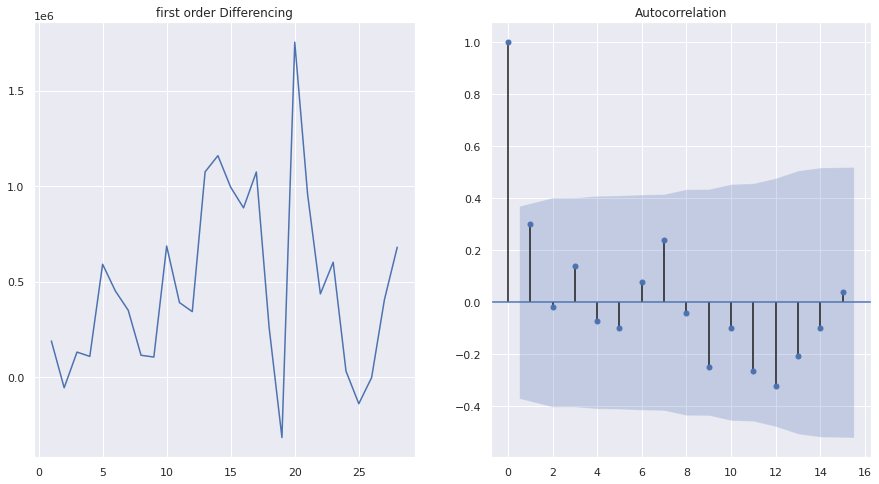

In [ ]:
f = plt.figure()
ax1 = f.add_subplot(121)
ax1.set_title('first order Differencing')
ax1.plot(tot_CO2.CO2_emmited_kt.diff())

ax2 = f.add_subplot(122)
plot_acf(tot_CO2.CO2_emmited_kt.diff().dropna(), ax=ax2);

In [ ]:
from statsmodels.tsa.stattools import adfuller
result = adfuller(tot_CO2.CO2_emmited_kt.dropna())
print('p-value: ', result[1])

result = adfuller(tot_CO2.CO2_emmited_kt.diff().dropna())
print('p-value: ', result[1])

result = adfuller(tot_CO2.CO2_emmited_kt.diff().diff().dropna())
print('p-value: ', result[1])


p-value:  0.9809947299735142
p-value:  0.004590054237048026
p-value:  1.0243755217384068e-07


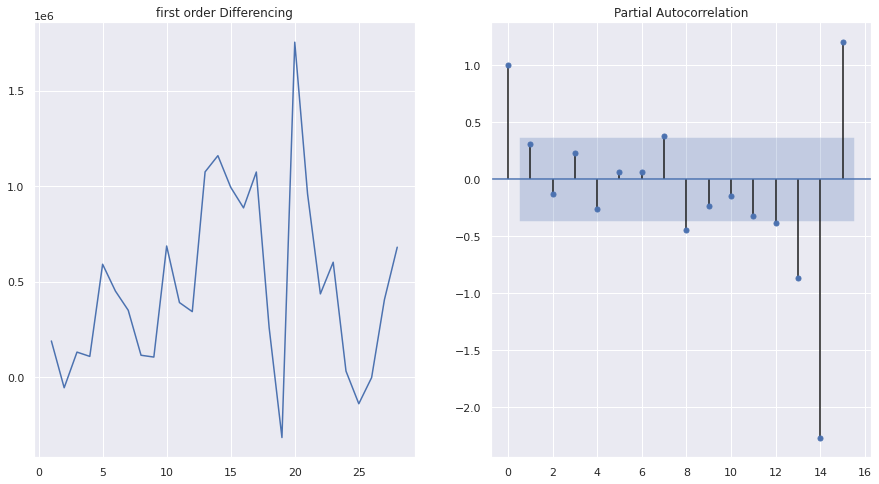

In [ ]:
f = plt.figure()
ax1 = f.add_subplot(121)
ax1.set_title('first order Differencing')
ax1.plot(tot_CO2.CO2_emmited_kt.diff())

ax2 = f.add_subplot(122)
plot_pacf(tot_CO2.CO2_emmited_kt.diff().dropna(), ax=ax2);

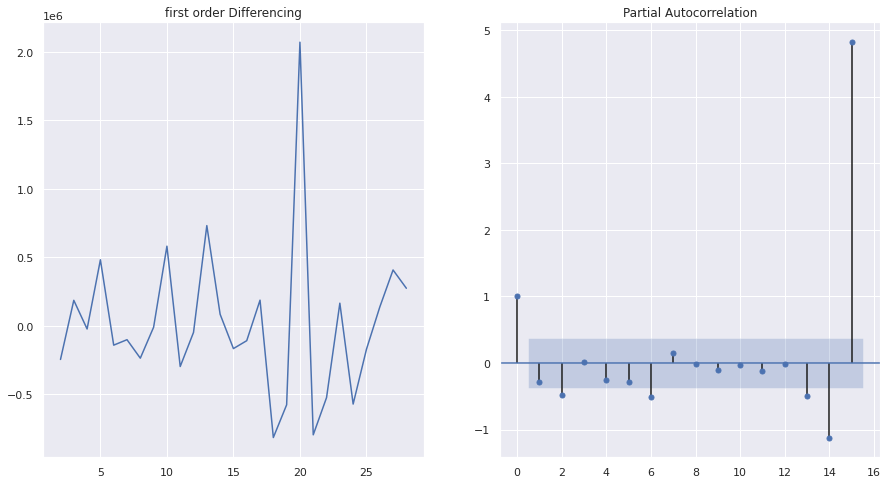

In [ ]:
f = plt.figure()
ax1 = f.add_subplot(121)
ax1.set_title('first order Differencing')
ax1.plot(tot_CO2.CO2_emmited_kt.diff().diff())

ax2 = f.add_subplot(122)
plot_pacf(tot_CO2.CO2_emmited_kt.diff().diff().dropna(), ax=ax2);

In [ ]:
import statsmodels.api as sm
import itertools
import warnings
warnings.filterwarnings('ignore')
# Grid Search
p = d = q = range(0,3) # p, d, and q can be either 0, 1, or 2
pdq = list(itertools.product(p,d,q)) # gets all possible combinations of p, d, and q 
p2 = d2 = q2 = range(0, 2) # second set of p's, d's, and q's for seasonal parameters
pdq2 = list(itertools.product(p2,d2,q2)) # similar to code above but for seasonal parameters
s = 12 # here I use twelve but the number here is representative of the periodicity of the seasonal cycle
pdqs2 = [(c[0], c[1], c[2], s) for c in pdq2]
combs = {}
aics = []
# Grid Search Continued
for combination in pdq:
    for seasonal_combination in pdqs2:
        try:
            model = sm.tsa.statespace.SARIMAX(tot_CO2.CO2_emmited_kt, order=combination, seasonal_order=seasonal_combination,
                                             enforce_stationarity=True,
                                             enforce_invertibility=True)
            model = model.fit(disp=False)
            combs.update({model.aic : [combination, seasonal_combination]})
            aics.append(model.aic)
            
        except:
            continue
            
best_aic = min(aics)

In [ ]:
print('best aic is: ', round(best_aic, 3))
print(40*'==')
print ('ARIMA parameters: ', '\n', 'AR: ', combs[best_aic][0][0], '\n', 'I: ',combs[best_aic][0][1], '\n', 'MA: ',combs[best_aic][0][2])
print('Seasonal parameters:', combs[best_aic][1])

best aic is:  453.903
ARIMA parameters:  
 AR:  1 
 I:  2 
 MA:  2
Seasonal parameters: (0, 1, 0, 12)


In [ ]:
# ARIMA (d = 1, p = 1, q = 1)

from statsmodels.tsa.arima_model import ARIMA

arima_model = ARIMA(tot_CO2.CO2_emmited_kt, order=(1,1,1))
model = arima_model.fit()
print(model.summary())

                             ARIMA Model Results                              
Dep. Variable:       D.CO2_emmited_kt   No. Observations:                   28
Model:                 ARIMA(1, 1, 1)   Log Likelihood                -402.335
Method:                       css-mle   S.D. of innovations         416368.303
Date:                Thu, 16 Jun 2022   AIC                            812.670
Time:                        02:07:50   BIC                            817.998
Sample:                             1   HQIC                           814.299
                                                                              
                             coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------------------
const                   4.734e+05   1.02e+05      4.650      0.000    2.74e+05    6.73e+05
ar.L1.D.CO2_emmited_kt    -0.4266      0.285     -1.498      0.147      -0.985       0.131
ma.L

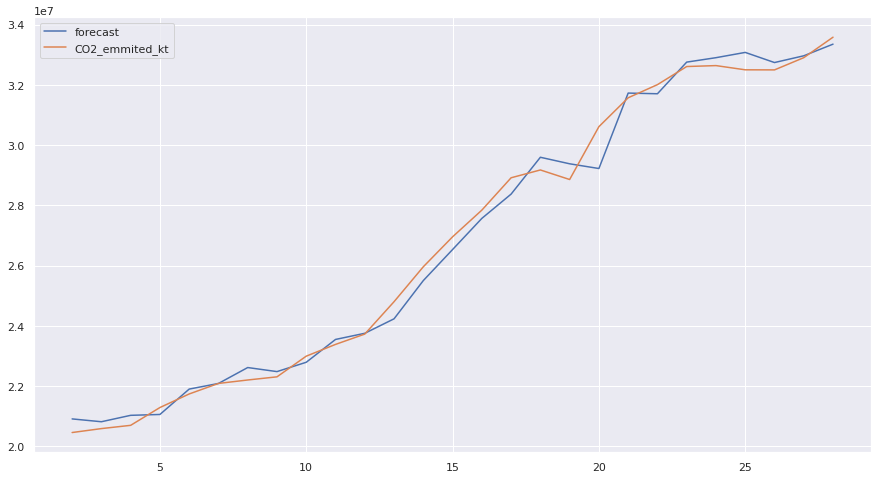

In [ ]:
model.plot_predict(dynamic=False);

In [ ]:
new_data = model.forecast(7)[0]
new_data

array([34161865.86663323, 34588525.20280682, 35081814.5873007 ,
       35546682.85952674, 36023674.18498334, 36495494.41022943,
       36969520.37332708])

In [ ]:
import itertools
for (i,j) in zip(range(2019, 2026), range(0, 7)):
  df = {'year': i, 'CO2_emmited_kt': new_data[j]}
  tot_CO2 = tot_CO2.append(df, ignore_index=True)

tot_CO2.tail()

,year,CO2_emmited_kt
31,2021.0,3.508181e+07
32,2022.0,3.554668e+07
33,2023.0,3.602367e+07
34,2024.0,3.649549e+07
35,2025.0,3.696952e+07


In [ ]:
tot_CO2['year'] = pd.to_datetime(tot_CO2.year, format='%Y').dt.year
tot_CO2.head()

,year,CO2_emmited_kt
0,1990,20324740.0
1,1991,20513610.0
2,1992,20457550.0
3,1993,20588180.0
4,1994,20696360.0


In [ ]:
tot_CO2['prediction'] = np.nan
tot_CO2['prediction'] = tot_CO2['year'].apply(lambda x: 'Actual' if x <= 2018 else 'Prediction')
tot_CO2.tail(10)

,year,CO2_emmited_kt,prediction
26,2016,3.249354e+07,Actual
27,2017,3.289892e+07,Actual
28,2018,3.357900e+07,Actual
29,2019,3.416187e+07,Prediction
30,2020,3.458853e+07,Prediction
31,2021,3.508181e+07,Prediction
32,2022,3.554668e+07,Prediction
33,2023,3.602367e+07,Prediction
34,2024,3.649549e+07,Prediction
35,2025,3.696952e+07,Prediction


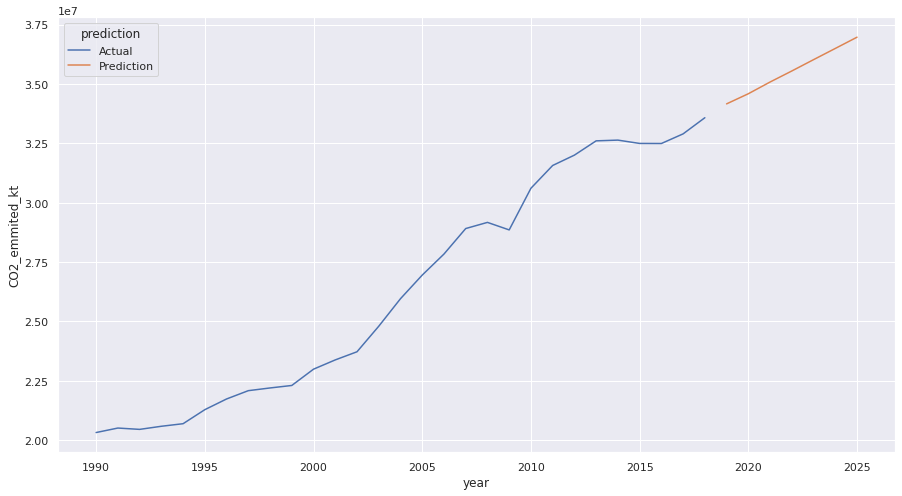

In [ ]:
sns.lineplot(x='year', y='CO2_emmited_kt', data=tot_CO2, hue='prediction')

In [ ]:
tot_CO2 = wbco_df_long.groupby('Year')['CO2_emitted'].sum()
tot_CO2 = tot_CO2[tot_CO2.index <= 2018].reset_index()
tot_CO2.columns = ['year', 'CO2_emmited_kt']
tot_CO2.year = pd.to_datetime(tot_CO2.year, format='%Y').dt.year

In [ ]:
arima_model = ARIMA(tot_CO2.CO2_emmited_kt[:26], order=(1,1,1))
model = arima_model.fit()
print(model.summary())

                             ARIMA Model Results                              
Dep. Variable:       D.CO2_emmited_kt   No. Observations:                   25
Model:                 ARIMA(1, 1, 1)   Log Likelihood                -360.360
Method:                       css-mle   S.D. of innovations         435229.588
Date:                Thu, 16 Jun 2022   AIC                            728.721
Time:                        02:04:55   BIC                            733.597
Sample:                             1   HQIC                           730.073
                                                                              
                             coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------------------
const                   4.869e+05   1.11e+05      4.405      0.000     2.7e+05    7.04e+05
ar.L1.D.CO2_emmited_kt    -0.4605      0.354     -1.302      0.206      -1.154       0.233
ma.L

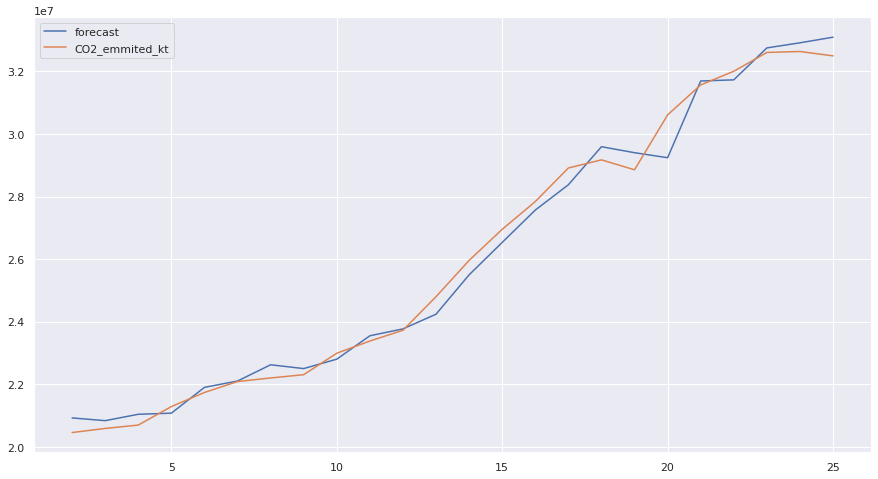

In [ ]:
model.plot_predict(dynamic=False);

In [ ]:
y_pred = pd.Series(model.forecast(3)[0], index=tot_CO2.CO2_emmited_kt[26:].index)
y_true = tot_CO2.CO2_emmited_kt[26:]

rmse = np.mean((y_pred - y_true)**2)**.5

rmse

323180.93813863024

# CLasification model (CO2 Reduction in the next period vs Credits Issued)

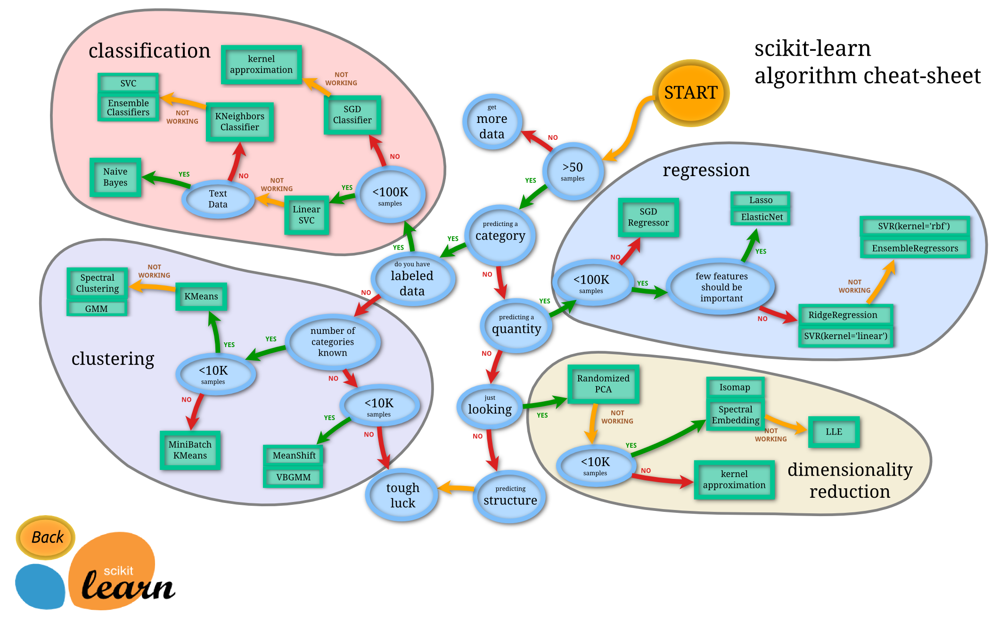

Following the Sklearn sheet cheat, we could try a SGD regressor to predict the amount of CO2 increased of reduced with the credit issued

In [ ]:
next_period_chg = all_df_2.copy().groupby(['country'])['CO2_emitted'].diff()
next_period_chg.head(10)

0           NaN
1      760000.0
2     5850000.0
3     1020000.0
4    -2280000.0
5    -7040000.0
6    -7400000.0
7    10890000.0
8    13490000.0
9     4470000.0
Name: CO2_emitted, dtype: float64

In [ ]:
input_data = all_df_2.copy()
input_data = pd.concat([input_data, next_period_chg], axis=1)
input_data.dropna(inplace=True)

input_data.columns = ['country', 'year', 'credits_issued', 'credits_retired', 'registry_issued_credits', 'redits_remaining', 'CO2_emitted', 'percentage_mitigation', 'CO2_change']

input_data.head(20)

,country,year,credits_issued,credits_retired,registry_issued_credits,redits_remaining,CO2_emitted,percentage_mitigation,CO2_change
1,Argentina,1997,0,0,0,0,127320000.0,0.000000,760000.0
2,Argentina,1998,0,0,0,0,133170000.0,0.000000,5850000.0
3,Argentina,1999,0,0,0,0,134190000.0,0.000000,1020000.0
4,Argentina,2000,0,0,0,0,131910000.0,0.000000,-2280000.0
5,Argentina,2001,0,0,0,0,124870000.0,0.000000,-7040000.0
6,Argentina,2002,0,0,0,0,117470000.0,0.000000,-7400000.0
7,Argentina,2003,0,0,0,0,128360000.0,0.000000,10890000.0
8,Argentina,2004,0,0,0,0,141850000.0,0.000000,13490000.0
9,Argentina,2005,0,0,0,0,146320000.0,0.000000,4470000.0
10,Argentina,2006,0,0,0,0,155370000.0,0.000000,9050000.0


In [ ]:
from sklearn.linear_model import SGDRegressor
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_squared_error
from sklearn.model_selection import train_test_split

x, y = input_data.credits_issued.values.reshape(-1, 1), input_data.CO2_change
xtrain, xtest, ytrain, ytest = train_test_split(x, y, test_size=.2)

reg = make_pipeline(StandardScaler(), SGDRegressor(alpha=0.00001, epsilon=0.01, eta0=0.1))

reg.fit(xtrain, ytrain)


score = reg.score(xtrain, ytrain)
print("R-squared:", score)


ypred = reg.predict(xtest)

mse = mean_squared_error(ytest, ypred)
print("MSE: ", mse)
print("RMSE: ", mse**(1/2.0))

R-squared: 0.020383403176710946
MSE:  1219776060726115.8
RMSE:  34925292.56464598


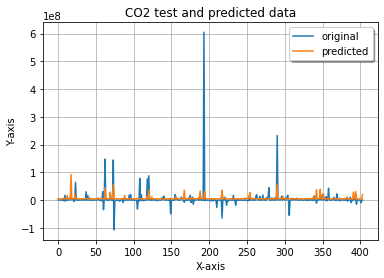

In [ ]:
x_ax = range(len(ytest))
plt.plot(x_ax, ytest, label="original")
plt.plot(x_ax, ypred, label="predicted")
plt.title("CO2 test and predicted data")
plt.xlabel('X-axis')
plt.ylabel('Y-axis')
plt.legend(loc='best',fancybox=True, shadow=True)
plt.grid(True)
plt.show()

Next try a SVR(Kernel = 'linear')

In [ ]:
from sklearn.svm import SVR

reg = make_pipeline(StandardScaler(), SVR(kernel='linear', C=100, gamma="auto"))

reg.fit(xtrain, ytrain)


score = reg.score(xtrain, ytrain)
print("R-squared:", score)


ypred = reg.predict(xtest)

mse = mean_squared_error(ytest, ypred)
print("MSE: ", mse)
print("RMSE: ", mse**(1/2.0))

R-squared: -0.013817630978549378
MSE:  1112729787545732.4
RMSE:  33357604.643405262


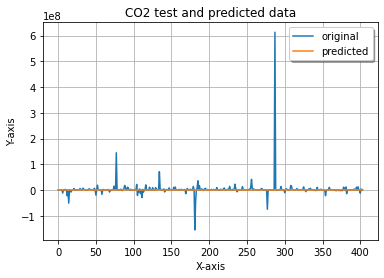

In [ ]:
x_ax = range(len(ytest))
plt.plot(x_ax, ytest, label="original")
plt.plot(x_ax, ypred, label="predicted")
plt.title("CO2 test and predicted data")
plt.xlabel('X-axis')
plt.ylabel('Y-axis')
plt.legend(loc='best',fancybox=True, shadow=True)
plt.grid(True)
plt.show()

..... Not working either

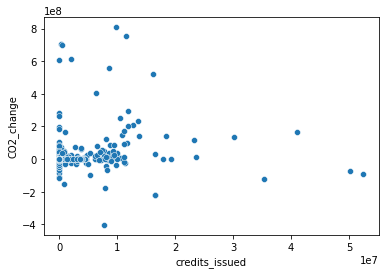

In [ ]:
sns.scatterplot(data=input_data, x='credits_issued', y='CO2_change')

In [ ]:
input_data.credits_issued.corr(input_data.CO2_change)

0.16463452340713847

# CLasification model (CO2 Reduction in the next period vs Fossil fuel energy consumption (% of total))

In [ ]:
# Get the new data (Fossil fuel energy consumption (% of total))

fuel_perc_cons = wb.data.DataFrame(['EG.USE.COMM.FO.ZS'])
fuel_perc_cons = fuel_perc_cons[fuel_perc_cons.index == 'WLD']

# Remove the preffix "YR" from the column names in World Bank datasource
fuel_columns=fuel_perc_cons.columns
new_fuel_columns = [y.replace('YR', '') for y in fuel_columns]
fuel_perc_cons.columns = new_fuel_columns

# Transform data from wide format to long format
columns = fuel_perc_cons.columns
# columns
fuel_perc_cons_df = fuel_perc_cons.reset_index()
fuel_perc_cons_df = pd.melt(fuel_perc_cons_df, id_vars=['economy'], value_vars=columns, var_name ='Year', value_name ='fossil_percentage').drop('economy', axis=1)
fuel_perc_cons_df['Year'] = pd.to_datetime(fuel_perc_cons_df['Year'], format='%Y').dt.year
fuel_perc_cons_df.columns = ['year', 'fossil_percentage']
fuel_perc_cons_df

,year,fossil_percentage
0,1960,94.134547
1,1961,94.095720
2,1962,94.217634
3,1963,94.424139
4,1964,94.537399
...,...,...
57,2017,NaN
58,2018,NaN
59,2019,NaN
60,2020,NaN


In [ ]:
tot_CO2 = wbco_df_long.groupby('Year')['CO2_emitted'].sum()
tot_CO2 = tot_CO2[tot_CO2.index <= 2018].reset_index()
tot_CO2.columns = ['year', 'CO2_emmited_kt']
tot_CO2.year = pd.to_datetime(tot_CO2.year, format='%Y').dt.year
tot_CO2.head()

,year,CO2_emmited_kt
0,1990,2.034663e+07
1,1991,2.048633e+07
2,1992,2.051598e+07
3,1993,2.065425e+07
4,1994,2.076851e+07


In [ ]:
tot_CO2_fuel = tot_CO2.merge(fuel_perc_cons_df, on='year').dropna()
tot_CO2_fuel

,year,CO2_emmited_kt,fossil_percentage
0,1990,2.034663e+07,80.761669
1,1991,2.048633e+07,80.304208
2,1992,2.051598e+07,80.082441
3,1993,2.065425e+07,79.983132
4,1994,2.076851e+07,79.792983
5,1995,2.136029e+07,79.817372
6,1996,2.181186e+07,79.834188
7,1997,2.218816e+07,79.977068
8,1998,2.230957e+07,79.759761
9,1999,2.241454e+07,79.727224


In [ ]:
tot_CO2_fuel['change_CO2_percentage'] = tot_CO2_fuel['CO2_emmited_kt'].pct_change()
tot_CO2_fuel['change_fossil_percentage'] = tot_CO2_fuel['fossil_percentage'].diff()/100
tot_CO2_fuel.dropna(inplace=True)
tot_CO2_fuel

,year,CO2_emmited_kt,fossil_percentage,change_CO2_percentage,change_fossil_percentage
1,1991,2.048633e+07,80.304208,0.006866,-0.004575
2,1992,2.051598e+07,80.082441,0.001447,-0.002218
3,1993,2.065425e+07,79.983132,0.006740,-0.000993
4,1994,2.076851e+07,79.792983,0.005532,-0.001901
5,1995,2.136029e+07,79.817372,0.028494,0.000244
6,1996,2.181186e+07,79.834188,0.021141,0.000168
7,1997,2.218816e+07,79.977068,0.017252,0.001429
8,1998,2.230957e+07,79.759761,0.005472,-0.002173
9,1999,2.241454e+07,79.727224,0.004705,-0.000325
10,2000,2.313005e+07,79.783849,0.031922,0.000566


In [ ]:
tot_CO2_fuel[['CO2_emmited_kt', 'fossil_percentage', 'change_CO2_percentage', 'change_fossil_percentage']].corr().style.background_gradient(cmap="Greys")

,CO2_emmited_kt,fossil_percentage,change_CO2_percentage,change_fossil_percentage
CO2_emmited_kt,1.000000,0.751742,0.114788,-0.165088
fossil_percentage,0.751742,1.000000,0.364191,0.367848
change_CO2_percentage,0.114788,0.364191,1.000000,0.666134
change_fossil_percentage,-0.165088,0.367848,0.666134,1.000000


In [ ]:
from sklearn.svm import SVR
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_squared_error
from sklearn.model_selection import train_test_split
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import r2_score
from sklearn.metrics import make_scorer

x, y = tot_CO2_fuel.change_fossil_percentage.values.reshape(-1, 1), tot_CO2_fuel.change_CO2_percentage
xtrain, xtest, ytrain, ytest = train_test_split(x, y, test_size=.3)

In [ ]:
param = {'C': [1.1, 5.4, 170, 1001],'gamma': [0.7001, 0.008, 0.001, 3.1, 1, 1.3, 5],
         'epsilon': [0.0003, 0.007, 0.0109, 0.019, 0.14, 0.05, 8, 0.2, 3, 2, 7]}

grid = GridSearchCV(estimator = SVR(kernel='linear'), param_grid = param, cv = 5, scoring='neg_mean_squared_error')
grid.fit(xtrain, ytrain)

#print the best parameters from all possible combinations
print("best parameters are: ", grid.best_params_)


best parameters are:  {'C': 1001, 'epsilon': 0.007, 'gamma': 0.7001}


In [ ]:
score = grid.score(xtrain, ytrain)
score

-0.0001798876782985246

In [ ]:
ypred = grid.predict(xtest)

mse = mean_squared_error(ytest, ypred)
print("MSE: ", mse)
print("RMSE: ", mse**(1/2.0))

MSE:  0.00017975621464861018
RMSE:  0.013407319443073256


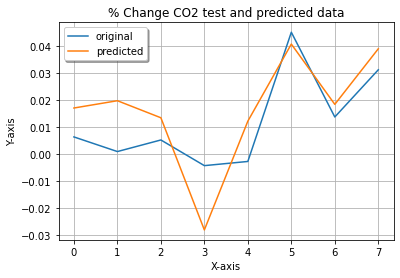

In [ ]:
x_ax = range(len(ytest))
plt.plot(x_ax, ytest, label="original")
plt.plot(x_ax, ypred, label="predicted")
plt.title("% Change CO2 test and predicted data")
plt.xlabel('X-axis')
plt.ylabel('Y-axis')
plt.legend(loc='best',fancybox=True, shadow=True)
plt.grid(True)
plt.show()

In [ ]:
grid.predict([[0.05]])

array([0.22053856])

In [ ]:
from joblib import Parallel, delayed
import joblib
 
 
# Save the model as a pickle in a file
# joblib.dump(grid, 'SVR_model.pkl')
 
# Load the model from the file
model = joblib.load('SVR_model.pkl')
 
# Use the loaded model to make predictions
model.predict([[0.04]])

array([0.18064932])

In [ ]:
ypred = model.predict(xtest)

In [ ]:
ytest.reset_index(inplace=True, drop=True)

In [ ]:
ytest

0    0.013716
1    0.007728
2    0.046351
3    0.028494
4    0.004705
5    0.060685
6   -0.011095
7    0.005472
Name: change_CO2_percentage, dtype: float64

In [ ]:
data = pd.concat([ytest, pd.Series(ypred)], axis=1)
data.columns = ['ytest', 'ypred']

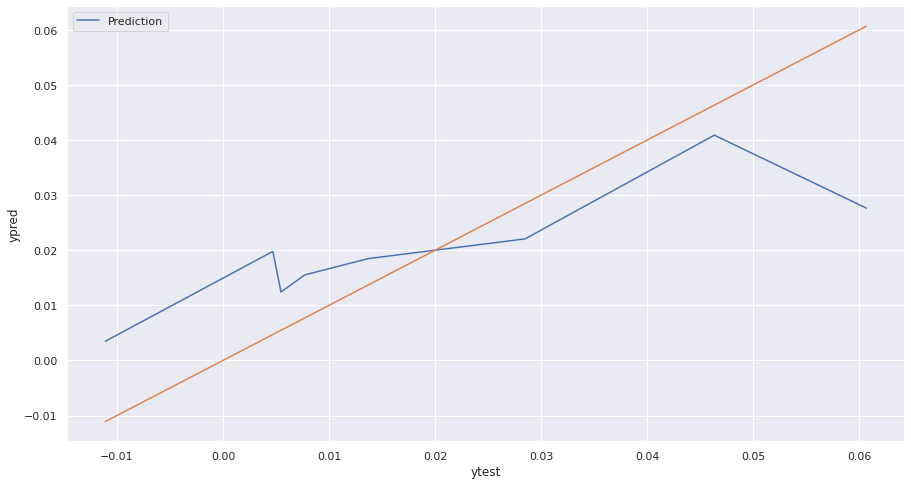

In [ ]:
g= sns.lineplot(data=data, x="ytest", y="ypred", label='Prediction')
lims = [-0.011095, 0.060685]
g.plot(lims, lims, '-r', label='Identity line')
plt.show()

In [ ]:
s = pd.DataFrame(np.arange(-0.03, 0.031, 0.001))
s.columns = ['Pct_change']
s['prediction'] = s.apply(lambda row: model.predict(row.Pct_change.reshape(1, -1))[0], axis = 1)
s['Pct_change'] = s['Pct_change']*-1

In [ ]:
s.columns = ['Pct_change_renewable', 'Pct_change_CO2_emitted']

In [ ]:
s

,Pct_change_renewable,Pct_change_CO2_emitted
0,0.030,-0.098575
1,0.029,-0.094586
2,0.028,-0.090598
3,0.027,-0.086609
4,0.026,-0.082620
...,...,...
56,-0.026,0.124804
57,-0.027,0.128793
58,-0.028,0.132782
59,-0.029,0.136771


In [ ]:
s.to_csv('ML_model_prediction.csv')

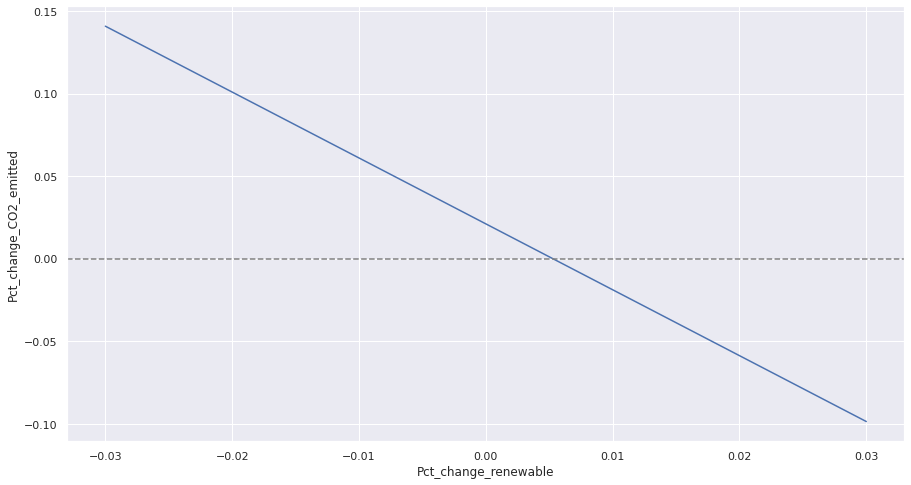

In [ ]:
g = sns.lineplot(data=s, x="Pct_change_renewable", y="Pct_change_CO2_emitted")
g.axhline(0, linestyle='--', color='Grey')

# Correlation

In [ ]:
all_df.corr()

,credits_issued,credits_retired,registry_issued_credits,first_year_of_project,year,credits_remaining,CO2_emitted
credits_issued,1.000000,0.198157,0.813938,-1.586887e-02,7.900930e-02,0.813938,-0.001229
credits_retired,0.198157,1.000000,0.169801,-2.643064e-02,1.017636e-01,0.169801,0.015301
registry_issued_credits,0.813938,0.169801,1.000000,-1.168835e-03,7.257649e-02,1.000000,-0.007109
first_year_of_project,-0.015869,-0.026431,-0.001169,1.000000e+00,-1.731779e-12,-0.001169,-0.082702
year,0.079009,0.101764,0.072576,-1.731779e-12,1.000000e+00,0.072576,0.152147
credits_remaining,0.813938,0.169801,1.000000,-1.168835e-03,7.257649e-02,1.000000,-0.007109
CO2_emitted,-0.001229,0.015301,-0.007109,-8.270214e-02,1.521469e-01,-0.007109,1.000000


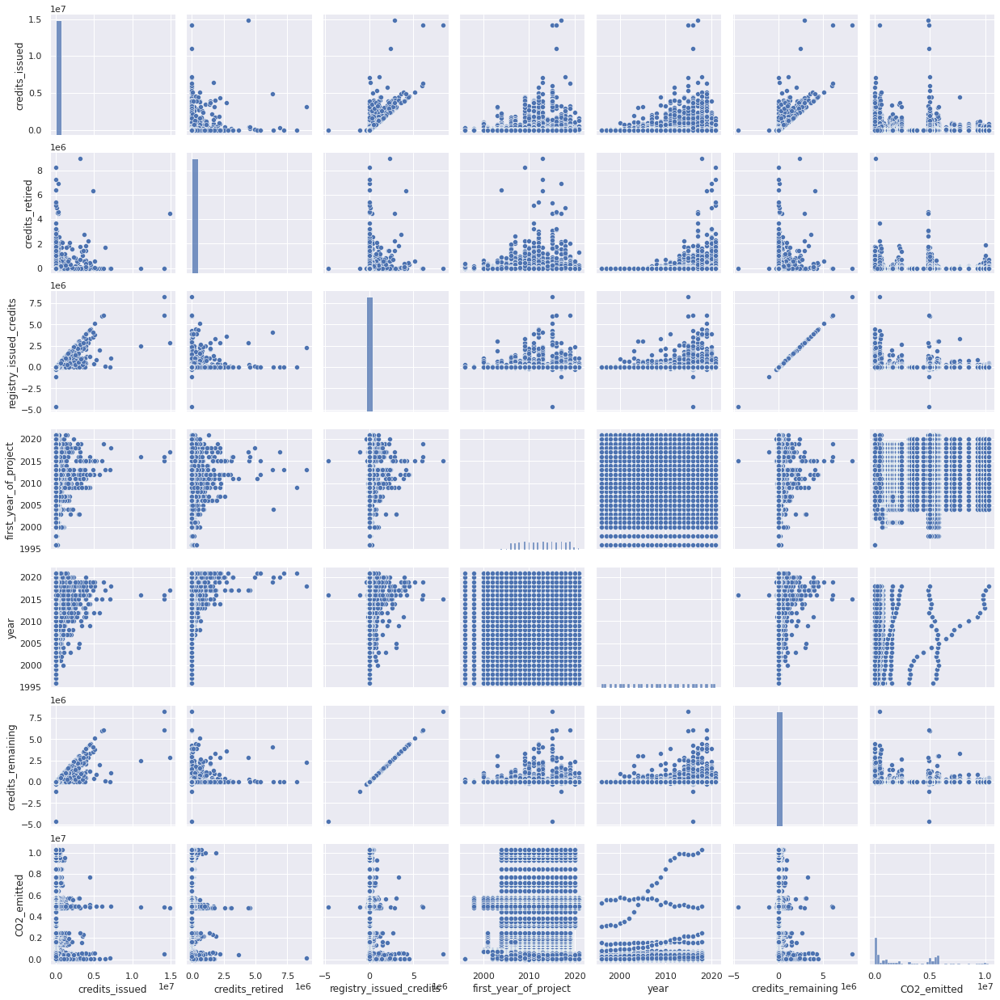

In [ ]:
sns.pairplot(all_df)

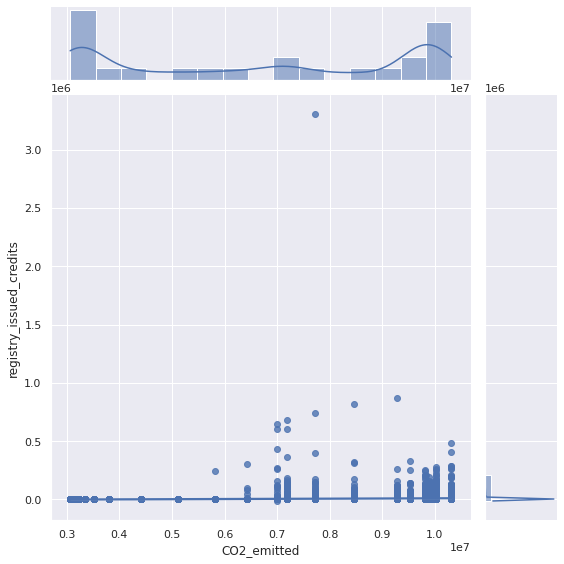

In [ ]:
sns.jointplot(
    x='CO2_emitted',
    y='registry_issued_credits',
    data=all_df[all_df['country'] == 'China'],
    kind='reg',
    height = 8)


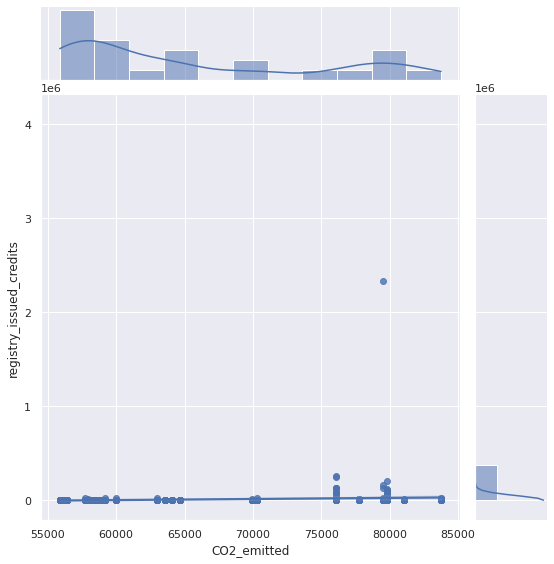

In [ ]:
sns.jointplot(
    x='CO2_emitted',
    y='registry_issued_credits',
    data=all_df[all_df['country'] == 'Colombia'],
    kind='reg',
    height = 8)


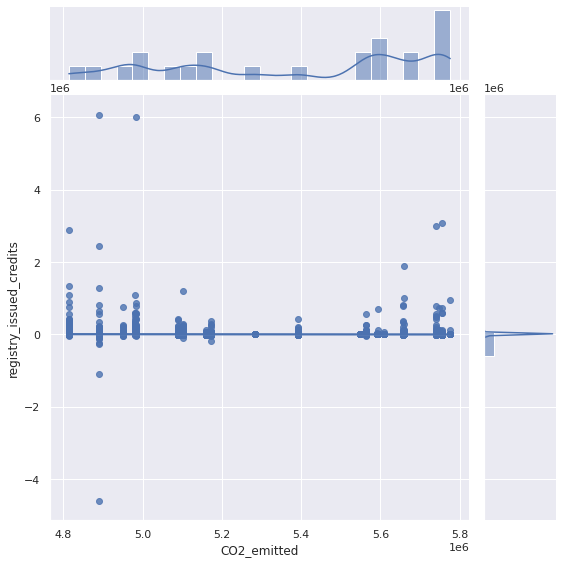

In [ ]:
sns.jointplot(
    x='CO2_emitted',
    y='registry_issued_credits',
    data=all_df[all_df['country'] == 'United States'],
    kind='reg',
    height = 8)


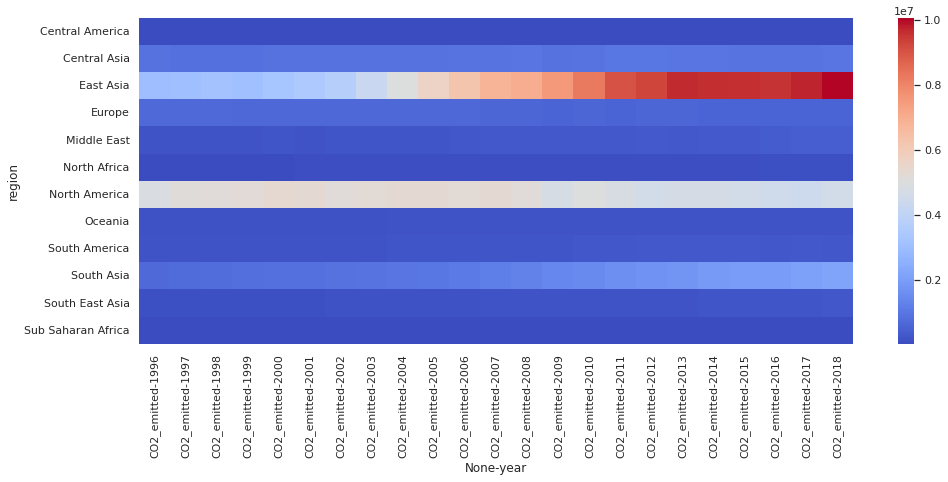

In [ ]:
pivoted_df = pd.pivot_table(data=all_df, 
                            index='region', 
                            columns=['year'], values=['CO2_emitted'])
plt.figure(figsize=(16, 6))
sns.heatmap(pivoted_df, cmap="coolwarm")


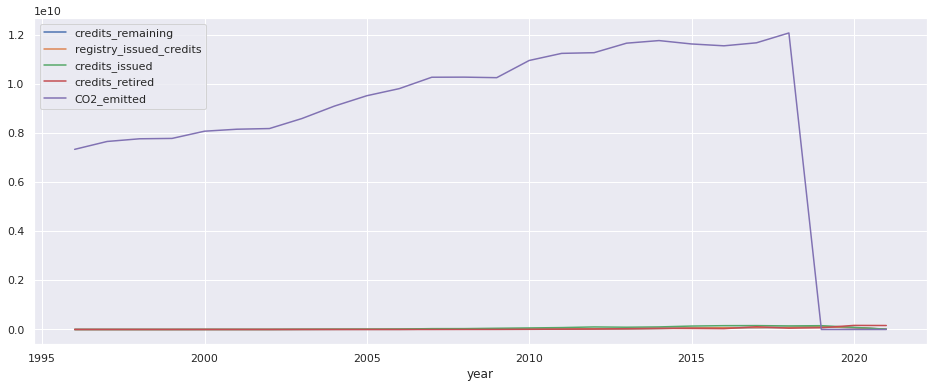

In [ ]:

all_df[['credits_remaining','registry_issued_credits', 'credits_issued','credits_retired','CO2_emitted', 'year']].groupby('year').sum().plot(figsize=(16, 6))

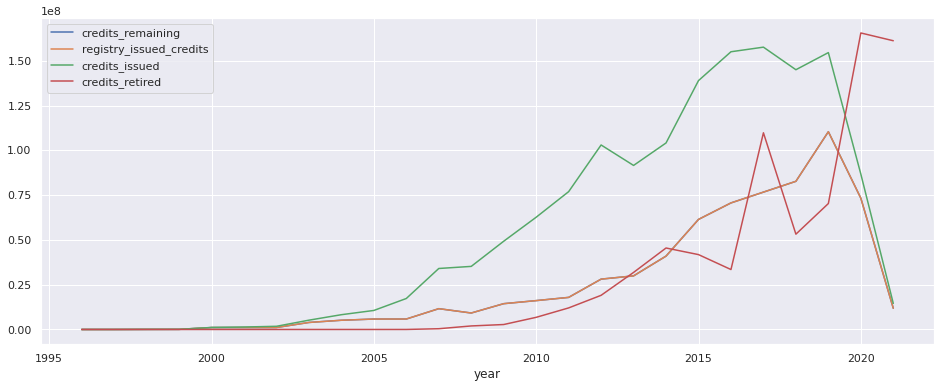

In [ ]:
all_df[['credits_remaining','registry_issued_credits', 'credits_issued','credits_retired', 'year']].groupby('year').sum().plot(figsize=(16, 6))

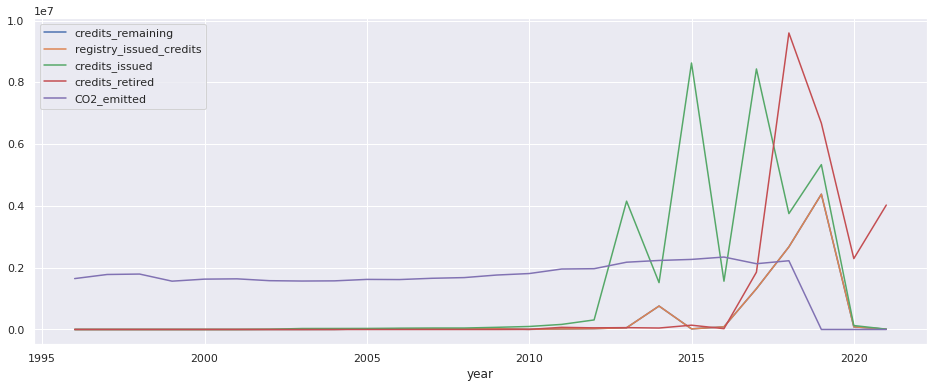

In [ ]:
all_df[all_df['country']=='Colombia'][
['credits_remaining','registry_issued_credits', 'credits_issued','credits_retired','CO2_emitted', 'year']].groupby('year').sum().plot(figsize=(16, 6))

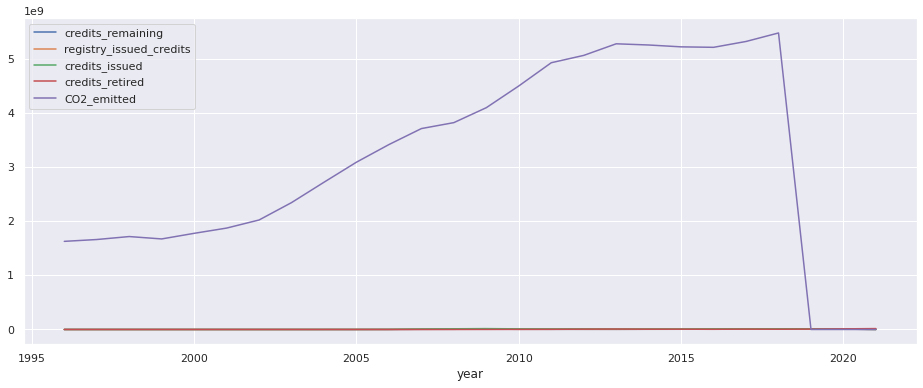

In [ ]:
all_df[all_df['country']=='China'][
['credits_remaining','registry_issued_credits', 'credits_issued','credits_retired','CO2_emitted', 'year']].groupby('year').sum().plot(figsize=(16, 6))

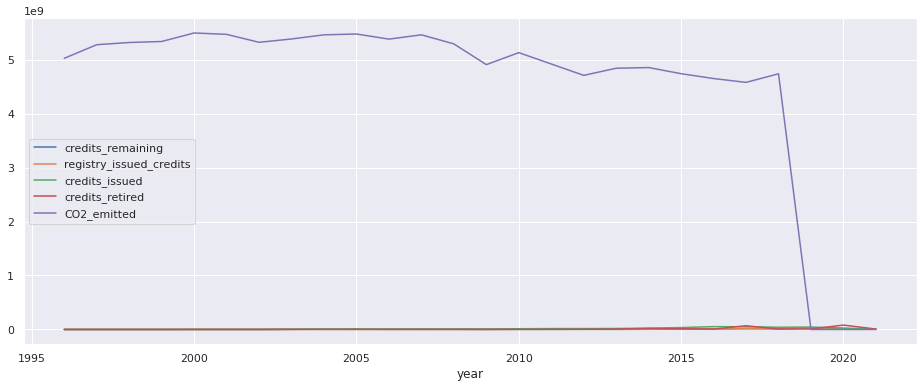

In [ ]:
all_df[all_df['country']=='United States'][
['credits_remaining','registry_issued_credits', 'credits_issued','credits_retired','CO2_emitted', 'year']].groupby('year').sum().plot(figsize=(16, 6))

In [ ]:
country_attributes = wb.economy.DataFrame(wbco.index.values.tolist())
country_attributes

,name,aggregate,longitude,latitude,region,adminregion,lendingType,incomeLevel,capitalCity
id,,,,,,,,,
AFG,Afghanistan,False,69.17610,34.5228,SAS,SAS,IDX,LIC,Kabul
AFE,Africa Eastern and Southern,True,NaN,NaN,,,,,
AFW,Africa Western and Central,True,NaN,NaN,,,,,
ALB,Albania,False,19.81720,41.3317,ECS,ECA,IBD,UMC,Tirane
DZA,Algeria,False,3.05097,36.7397,MEA,MNA,IBD,LMC,Algiers
...,...,...,...,...,...,...,...,...,...
PSE,West Bank and Gaza,False,NaN,NaN,MEA,MNA,LNX,LMC,
WLD,World,True,NaN,NaN,,,,,
YEM,"Yemen, Rep.",False,44.20750,15.3520,MEA,MNA,IDX,LIC,Sana'a


In [ ]:
lat_lon = country_attributes.reset_index()[['name', 'latitude', 'longitude']]
lat_lon.head()

,name,latitude,longitude
0,Afghanistan,34.5228,69.17610
1,Africa Eastern and Southern,NaN,NaN
2,Africa Western and Central,NaN,NaN
3,Albania,41.3317,19.81720
4,Algeria,36.7397,3.05097


In [ ]:
geo_all_df = all_df.merge(lat_lon, left_on=['country'], right_on=['name']).drop(columns=['name'])
geo_all_df.head(2)

,project_id,credits_issued,credits_retired,registry_issued_credits,voluntary_registry,arb_project,voluntary_status,scope,type,reduction_removal,...,region,country,state,first_year_of_project,project_type,year,credits_remaining,CO2_emitted,latitude,longitude
0,ACR102,0,0,0,ACR,No,Completed,Chemical Processes,SF6 Replacement,Reduction,...,North America,United States,OREGON,2003.0,Industrial Gas Substitution,1996,0,5283110.0,38.8895,-77.032
1,ACR103,0,0,0,ACR,No,Completed,Agriculture,Manure Methane Digester,Reduction,...,North America,United States,CALIFORNIA,2003.0,Livestock Waste Management,1996,0,5283110.0,38.8895,-77.032


In [ ]:
all_df2 = all_df.rename(columns={'CO2_emitted': 'co2_emitted'})
all_df2.columns

Index(['project_id', 'credits_issued', 'credits_retired',
       'registry_issued_credits', 'voluntary_registry', 'arb_project',
       'voluntary_status', 'scope', 'type', 'reduction_removal',
       'methodology_protocol', 'region', 'country', 'state',
       'first_year_of_project', 'project_type', 'year', 'credits_remaining',
       'co2_emitted'],
      dtype='object')

In [ ]:
wbco_df_long

,name,Year,CO2_emitted
0,Afghanistan,1990,2960.0
1,Albania,1990,6050.0
2,Algeria,1990,67890.0
3,Andorra,1990,410.0
4,Angola,1990,6330.0
...,...,...,...
5534,"Venezuela, RB",2018,138160.0
5535,Vietnam,2018,257860.0
5536,"Yemen, Rep.",2018,9310.0
5537,Zambia,2018,7740.0


In [ ]:
import matplotlib.pyplot as plt

fig, ax = plt.subplots(1, 1)

world.plot(column='pop_est', ax=ax, legend=True)

In [ ]:
tot_CO2 = wbco_df_long.groupby('Year')['CO2_emitted'].sum()
tot_CO2 = tot_CO2[tot_CO2.index <= 2018].reset_index()
tot_CO2.columns = ['year', 'CO2_emmited_kt']
tot_CO2.year = pd.to_datetime(tot_CO2.year, format='%Y').dt.year
tot_CO2.head()

,year,CO2_emmited_kt
0,1990,20324740.0
1,1991,20513610.0
2,1992,20457550.0
3,1993,20588180.0
4,1994,20696360.0
